# Topic Modelling and Word Embeddings 

In this notebook, as well as carrying out some extra exploratory data analysis, I have completed some topic modelling and created a Word2Vec model for all the translated song lyrics that I extracted from the Spotify charts. 

In [3]:
# Import the relevant libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import time
import os

from langdetect import detect
import nltk
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.stem import WordNetLemmatizer
from nltk import pos_tag
from collections import Counter

import re, nltk, spacy, string

from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
from sklearn.decomposition import LatentDirichletAllocation, TruncatedSVD
from sklearn.metrics.pairwise import linear_kernel
from sklearn.model_selection import GridSearchCV
from sklearn.feature_extraction.text import TfidfTransformer;
from sklearn.decomposition import NMF;
from sklearn.preprocessing import normalize
from sklearn.manifold import TSNE
from pprint import pprint

import gensim
from gensim import corpora
from gensim.models import word2vec

import pyLDAvis
import pyLDAvis.sklearn
import pyLDAvis.gensim
import matplotlib.pyplot as plt
%matplotlib inline

from plotly.offline import plot
import plotly.graph_objects as go
import plotly.express as px

import warnings
warnings.filterwarnings("ignore")

In [4]:
# Let's start by importing the files
global_path = r'D:\AllWomen\_Final Project\Spotify Project\Datasets\Lyrics\Global Lyrics Dataset.csv'
pwd = os.getcwd()
os.chdir(os.path.dirname(global_path))
globalx = pd.read_csv(os.path.basename(global_path), encoding="ISO-8859-1", index_col=0)
os.chdir(pwd)

In [5]:
# Creating a new column 
globalx['language'] = globalx['country']
globalx.head()

,song_title,artist/s,country,lyrics,language
0,Blinding Lights,The Weeknd,Global,yeah ive been tryna call ive been on my own f...,Global
1,Don't Start Now,Dua Lipa,Global,"if you dont wanna see me did a full 180, craz...",Global
2,The Box,Roddy Ricch,Global,pullin out the coupe at the lot told em fuck 1...,Global
3,Dance Monkey,Tones And I,Global,"they say, ""oh my god, i see the way you shine ...",Global
4,Roses - Imanbek Remix,"['SAINt JHN', 'Imanbek']",Global,roses i walked in the corner with the body scr...,Global


In [6]:
# Defining the language detection function 
def language_detection(text):
    try:
        return detect(text)
    except:
        return None

In [7]:
# Applying language detection to the lyrics 
globalx.language = globalx.lyrics.apply(language_detection)

Wall time: 5.68 s


In [9]:
# Importing the USA dataset 
usa_path = r'D:\AllWomen\_Final Project\Spotify Project\Datasets\Lyrics\United States Lyrics Dataset.csv'
pwd = os.getcwd()
os.chdir(os.path.dirname(usa_path))
usa = pd.read_csv(os.path.basename(usa_path), encoding="ISO-8859-1", index_col=0)
os.chdir(pwd)

In [10]:
# Applying language detection to the USA dataset 
usa['language'] = usa['lyrics'].apply(language_detection)
usa[['song_title','language']].head()

,song_title,language
0,Blinding Lights,en
1,The Box,en
2,Turks (feat. Travis Scott),en
3,Blueberry Faygo,en
4,Don't Start Now,en


In [11]:
# Importing the UK dataset 
uk_path = r'D:\AllWomen\_Final Project\Spotify Project\Datasets\Lyrics\United Kingdom Lyrics Dataset.csv'
pwd = os.getcwd()
os.chdir(os.path.dirname(uk_path))
uk = pd.read_csv(os.path.basename(uk_path), encoding="ISO-8859-1", index_col=0)
os.chdir(pwd)

In [12]:
# Applying language detection to the UK dataset 
uk['language'] = uk['lyrics'].apply(language_detection)
uk[['song_title','language']].head()

,song_title,language
0,Blinding Lights,en
1,Roses - Imanbek Remix,en
2,Physical,en
3,Don't Start Now,en
4,The Box,en


In [13]:
# Importing the Brazil dataset 
brazil_path = r'D:\AllWomen\_Final Project\Spotify Project\Datasets\Lyrics\Brazil Lyrics Dataset.csv'
pwd = os.getcwd()
os.chdir(os.path.dirname(brazil_path))
brazil = pd.read_csv(os.path.basename(brazil_path), encoding="ISO-8859-1", index_col=0)
os.chdir(pwd)

In [14]:
# Applying language detection to the Brazil dataset 
brazil['language'] = brazil['lyrics'].apply(language_detection)
brazil[['song_title','language']].head()

,song_title,language
0,Liberdade Provisória - Ao Vivo,pt
1,A Gente Fez Amor - Ao Vivo,pt
2,BRABA,pt
3,Don't Start Now,en
4,Graveto - Ao Vivo,pt


In [15]:
# Importing the Germany dataset 
germany_path = r'D:\AllWomen\_Final Project\Spotify Project\Datasets\Lyrics\Germany Lyrics Dataset.csv'
pwd = os.getcwd()
os.chdir(os.path.dirname(germany_path))
germany = pd.read_csv(os.path.basename(germany_path), encoding="ISO-8859-1", index_col=0)
os.chdir(pwd)

In [16]:
# Applying language detection to the Germany dataset 
germany['language'] = germany['lyrics'].apply(language_detection)
germany[['song_title','language']].head()

,song_title,language
0,Du bist mein,de
1,Allein sein,de
2,Blinding Lights,en
3,H <3 T E L,de
4,Puste sie weg,de


In [17]:
# Importing the Spain dataset 
spain_path = r'D:\AllWomen\_Final Project\Spotify Project\Datasets\Lyrics\Spain Lyrics Dataset.csv'
pwd = os.getcwd()
os.chdir(os.path.dirname(spain_path))
spain = pd.read_csv(os.path.basename(spain_path), encoding="ISO-8859-1", index_col=0)
os.chdir(pwd)

In [18]:
# Applying language detection to the Spain dataset 
spain['language'] = spain['lyrics'].apply(language_detection)
spain[['song_title','language']].head()

,song_title,language
0,Safaera,es
1,Tusa,es
2,Amarillo,es
3,Rojo,es
4,La Difí­cil,es


In [19]:
# Importing the Mexico dataset 
mexico_path = r'D:\AllWomen\_Final Project\Spotify Project\Datasets\Lyrics\Mexico Lyrics Dataset.csv'
pwd = os.getcwd()
os.chdir(os.path.dirname(mexico_path))
mexico = pd.read_csv(os.path.basename(mexico_path), encoding="ISO-8859-1", index_col=0)
os.chdir(pwd)

In [20]:
# Applying language detection to the Mexico dataset 
mexico['language'] = mexico['lyrics'].apply(language_detection)
mexico[['song_title','language']].head(1)

,song_title,language
0,Safaera,es


In [21]:
# Importing the Italy dataset 
italy_path = r'D:\AllWomen\_Final Project\Spotify Project\Datasets\Lyrics\Italy Lyrics Dataset.csv'
pwd = os.getcwd()
os.chdir(os.path.dirname(italy_path))
italy = pd.read_csv(os.path.basename(italy_path), encoding="ISO-8859-1", index_col=0)
os.chdir(pwd)

In [22]:
# Applying language detection to the Italy dataset 
italy['language'] = italy['lyrics'].apply(language_detection)
italy[['song_title','language']].head()

,song_title,language
0,Auto Blu,it
1,"SPORT + muscoli (RMX) (feat. Lazza, Paky, Luch...",it
2,Bando,it
3,Fiori di Chernobyl,it
4,Good Times,it


In [23]:
# Importing the Philippines dataset 
philippines_path = r'D:\AllWomen\_Final Project\Spotify Project\Datasets\Lyrics\Philippines Lyrics Dataset.csv'
pwd = os.getcwd()
os.chdir(os.path.dirname(philippines_path))
philippines = pd.read_csv(os.path.basename(philippines_path), encoding="ISO-8859-1", index_col=0)
os.chdir(pwd)

In [24]:
# Applying language detection to the Philippines dataset 
philippines['language'] = philippines['lyrics'].apply(language_detection)
philippines.language[47] = 'ko'
philippines[['song_title','language']].tail()

,song_title,language
45,Sanctuary,en
46,I.F.L.Y.,en
47,WANNABE,ko
48,Teka Lang,tl
49,Kung 'Di Rin Lang Ikaw,tl


In [25]:
# Importing the Netherlands dataset 
netherlands_path = r'D:\AllWomen\_Final Project\Spotify Project\Datasets\Lyrics\Netherlands Lyrics Dataset.csv'
pwd = os.getcwd()
os.chdir(os.path.dirname(netherlands_path))
netherlands = pd.read_csv(os.path.basename(netherlands_path), encoding="ISO-8859-1", index_col=0)
os.chdir(pwd)

In [26]:
# Applying language detection to the Netherlands dataset 
netherlands['language'] = netherlands['lyrics'].apply(language_detection)
netherlands[['song_title','language']].tail()

,song_title,language
45,Roller Coaster,en
46,Own It (feat. Ed Sheeran & Burna Boy),en
47,Someone You Loved,en
48,Reünie,nl
49,Drown (feat. Clinton Kane),en


### Bit of dataset surgery

Here I needed to merge the translated lyrics with the rest of the dataset because VADER only works on English language texts. So I imported the translated lyrics for all countries and merged them with the other datasets. For the translation, I used the TextBlob library which works using the Google translate API in a separate notebook and due to errors in the translation, I had to correct the texts.

In [27]:
# Importing the Global translated lyrics
global_path = r'D:\AllWomen\_Final Project\Spotify Project\Datasets\Lyrics\Translated\Global Lyrics Translated.csv'
pwd = os.getcwd()
os.chdir(os.path.dirname(global_path))
t_global = pd.read_csv(os.path.basename(global_path), encoding="ISO-8859-1", index_col=0)
os.chdir(pwd)

In [28]:
# Merging the Global dataset and translation 
t_global = t_global['en_translation']
globalx['en_translation'] = [value for value in t_global]
globalx.head(10)

,song_title,artist/s,country,lyrics,language,en_translation
0,Blinding Lights,The Weeknd,Global,yeah ive been tryna call ive been on my own f...,en,yeah ive been tryna call ive been on my own f...
1,Don't Start Now,Dua Lipa,Global,"if you dont wanna see me did a full 180, craz...",en,"if you dont wanna see me did a full 180, craz..."
2,The Box,Roddy Ricch,Global,pullin out the coupe at the lot told em fuck 1...,en,pullin out the coupe at the lot told em fuck 1...
3,Dance Monkey,Tones And I,Global,"they say, ""oh my god, i see the way you shine ...",en,"they say, ""oh my god, i see the way you shine ..."
4,Roses - Imanbek Remix,"['SAINt JHN', 'Imanbek']",Global,roses i walked in the corner with the body scr...,en,roses i walked in the corner with the body scr...
5,death bed (coffee for your head) (feat. beabad...,"['Powfu', 'beabadoobee']",Global,"dont stay awake for too long, dont go to bed i...",en,"dont stay awake for too long, dont go to bed i..."
6,Break My Heart,Dua Lipa,Global,ive always been the one to say the first goodb...,en,ive always been the one to say the first goodb...
7,Say So,Doja Cat,Global,"day to night to morning, keep with me in the m...",en,"day to night to morning, keep with me in the m..."
8,Safaera,"['Bad Bunny', 'Jowell & Randy', 'Nengo Flow']",Global,"bla, bla, bla, bla, bla, bla ey, yo, yo, yo yo...",es,"blah blah blah blah blah blah hey, I, I, I I, ..."
9,Physical,Dua Lipa,Global,common love isnt for us we created something p...,en,common love isnt for us we created something p...


In [29]:
# Importing the translated lyrics and merging them with the USA dataset
usa_path = r'D:\AllWomen\_Final Project\Spotify Project\Datasets\Lyrics\Translated\United States Lyrics Translated.csv'
pwd = os.getcwd()
os.chdir(os.path.dirname(usa_path))
t_usa = pd.read_csv(os.path.basename(usa_path), encoding="ISO-8859-1", index_col=0)
os.chdir(pwd)

t_usa = t_usa['en_translation']
usa['en_translation'] = [value for value in t_usa]
usa.head()

,song_title,artist/s,country,lyrics,language,en_translation
0,Blinding Lights,The Weeknd,United States,yeah ive been tryna call ive been on my own f...,en,yeah ive been tryna call ive been on my own f...
1,The Box,Roddy Ricch,United States,pullin out the coupe at the lot told em fuck 1...,en,pullin out the coupe at the lot told em fuck 1...
2,Turks (feat. Travis Scott),"['NAV', 'Gunna', 'Travis Scott']",United States,"(wheezy outta here) im a late bloomer, third y...",en,"(wheezy outta here) im a late bloomer, third y..."
3,Blueberry Faygo,Lil Mosey,United States,"damn, callan (damn, callan) one bad bitch and...",en,"damn, callan (damn, callan) one bad bitch and..."
4,Don't Start Now,Dua Lipa,United States,"if you dont wanna see me did a full 180, craz...",en,"if you dont wanna see me did a full 180, craz..."


In [30]:
# Duplicating the UK lyrics because all the lyrics are already in English
uk['en_translation'] = uk['lyrics']
uk.head()

,song_title,artist/s,country,lyrics,language,en_translation
0,Blinding Lights,The Weeknd,United Kingdom,yeah ive been tryna call ive been on my own f...,en,yeah ive been tryna call ive been on my own f...
1,Roses - Imanbek Remix,"['SAINt JHN', 'Imanbek']",United Kingdom,roses i walked in the corner with the body scr...,en,roses i walked in the corner with the body scr...
2,Physical,Dua Lipa,United Kingdom,common love isnt for us we created something p...,en,common love isnt for us we created something p...
3,Don't Start Now,Dua Lipa,United Kingdom,"if you dont wanna see me did a full 180, craz...",en,"if you dont wanna see me did a full 180, craz..."
4,The Box,Roddy Ricch,United Kingdom,pullin out the coupe at the lot told em fuck 1...,en,pullin out the coupe at the lot told em fuck 1...


In [31]:
# Importing the translated lyrics and merging them with the Brazil dataset
brazil_path = r'D:\AllWomen\_Final Project\Spotify Project\Datasets\Lyrics\Translated\Brazil Lyrics Translated.csv'
pwd = os.getcwd()
os.chdir(os.path.dirname(brazil_path))
t_brazil = pd.read_csv(os.path.basename(brazil_path), encoding="ISO-8859-1", index_col=0)
os.chdir(pwd)

t_brazil = t_brazil['en_translation']
brazil['en_translation'] = [value for value in t_brazil]
brazil.head()

,song_title,artist/s,country,lyrics,language,en_translation
0,Liberdade Provisória - Ao Vivo,Henrique & Juliano,Brazil,no inicio foi assim terminou tá terminado cada...,pt,at the beginning it was like this is finished ...
1,A Gente Fez Amor - Ao Vivo,Gusttavo Lima,Brazil,a gente tinha combinado que já tava tudo errad...,pt,we had agreed that it was all wrong that it wa...
2,BRABA,Luísa Sonza,Brazil,"sonza, hmm hmm deixa eu te falar eu sou do ti...",pt,"sleep, hmm hmm let me tell you i'm the type th..."
3,Don't Start Now,Dua Lipa,Brazil,"if you dont wanna see me did a full 180, craz...",en,"if you dont wanna see me did a full 180, craz..."
4,Graveto - Ao Vivo,Marília Mendonça,Brazil,vou ser sincero com você acho que pra mim já d...,pt,I will be honest with you I think it's been a ...


In [32]:
# Importing the translated lyrics and merging them with the Germany dataset
germany_path = r'D:\AllWomen\_Final Project\Spotify Project\Datasets\Lyrics\Translated\Germany Lyrics Translated.csv'
pwd = os.getcwd()
os.chdir(os.path.dirname(germany_path))
t_germany = pd.read_csv(os.path.basename(germany_path), encoding="ISO-8859-1", index_col=0)
os.chdir(pwd)

t_germany = t_germany['en_translation']
germany['en_translation'] = [value for value in t_germany]
germany.head()

,song_title,artist/s,country,lyrics,language,en_translation
0,Du bist mein,"['Zuna', 'Loredana', 'SRNO']",Germany,"srno marihuana wenn ich bei dir bin, geht es ...",de,srno marijuana when I am with you you feel bet...
1,Allein sein,Ufo361,Germany,"rich rich ich will allein sein, wenn ich mein...",de,rich rich i want to be alone when i count my m...
2,Blinding Lights,The Weeknd,Germany,yeah ive been tryna call ive been on my own f...,en,yeah ive been tryna call ive been on my own f...
3,H <3 T E L,"['Dardan', 'Monet192']",Germany,"sie ist bis um drei in meim hotel zimmer 442, ...",de,"she is in my hotel room 442 until three, she h..."
4,Puste sie weg,Kontra K,Germany,liebe in der luft puste sie weg neun millimet...,de,love in the air blow it away nine millimeters ...


In [33]:
# Importing the translated lyrics and merging them with the Spain dataset
spain_path = r'D:\AllWomen\_Final Project\Spotify Project\Datasets\Lyrics\Translated\Spain Lyrics Translated.csv'
pwd = os.getcwd()
os.chdir(os.path.dirname(spain_path))
t_spain = pd.read_csv(os.path.basename(spain_path), encoding="ISO-8859-1", index_col=0)
os.chdir(pwd)

t_spain = t_spain['en_translation']
spain['en_translation'] = [value for value in t_spain]
spain.head()

,song_title,artist/s,country,lyrics,language,en_translation
0,Safaera,"['Bad Bunny', 'Jowell & Randy', 'Nengo Flow']",Spain,"bla, bla, bla, bla, bla, bla ey, yo, yo, yo yo...",es,"blah blah blah blah blah blah hey, I, I, I I, ..."
1,Tusa,"['KAROL G', 'Nicki Minaj']",Spain,¿qué pasa contigo? dí­melo rrr! o o ovy on the...,es,What's the matter with you? tell me rrr! o o o...
2,Amarillo,J Balvin,Spain,"son más de las doce, nos fuimos de roce hoy vo...",es,"It's more than twelve o'clock, we went into fr..."
3,Rojo,J Balvin,Spain,"(colores) yeah j balvin, man leggo, leggo ¿a ...",es,"(colors) yeah j balvin, man leggo, leggo who d..."
4,La Difí­cil,Bad Bunny,Spain,"ella desaparece, pero aparece cuando le dan ga...",es,"She disappears, but she appears when they feel..."


In [34]:
# Importing the translated lyrics and merging them with the Mexico dataset
mexico_path = r'D:\AllWomen\_Final Project\Spotify Project\Datasets\Lyrics\Translated\Mexico Lyrics Translated.csv'
pwd = os.getcwd()
os.chdir(os.path.dirname(mexico_path))
t_mexico = pd.read_csv(os.path.basename(mexico_path), encoding="ISO-8859-1", index_col=0)
os.chdir(pwd)

t_mexico = t_mexico['en_translation']
mexico['en_translation'] = [value for value in t_mexico]
mexico.head()

,song_title,artist/s,country,lyrics,language,en_translation
0,Safaera,"['Bad Bunny', 'Jowell & Randy', 'Nengo Flow']",Mexico,"bla, bla, bla, bla, bla, bla ey, yo, yo, yo yo...",es,"blah blah blah blah blah blah hey, I, I, I I, ..."
1,Si Veo a Tu Mamá,Bad Bunny,Mexico,"yeh, yeh todavía yo te quiero pero sé que e un...",es,"yeh, yeh I still love you but I know that it i..."
2,Yo Perreo Sola,Bad Bunny,Mexico,ante tú me pichaba (tú me pichaba) ahora yo pi...,es,before you I was pecking (you were pecking me)...
3,Rojo,J Balvin,Mexico,"(colores) yeah j balvin, man leggo, leggo ¿a ...",es,"(colors) yeah j balvin, man leggo, leggo who d..."
4,La Difícil,Bad Bunny,Mexico,"ella desaparece, pero aparece cuando le dan ga...",es,"She disappears, but she appears when they feel..."


In [35]:
# Importing the translated lyrics and merging them with the Italy dataset
italy_path = r'D:\AllWomen\_Final Project\Spotify Project\Datasets\Lyrics\Translated\Italy Lyrics Translated.csv'
pwd = os.getcwd()
os.chdir(os.path.dirname(italy_path))
t_italy = pd.read_csv(os.path.basename(italy_path), encoding="ISO-8859-1", index_col=0)
os.chdir(pwd)

t_italy = t_italy['en_translation']
italy['en_translation'] = [value for value in t_italy]
italy.head()

,song_title,artist/s,country,lyrics,language,en_translation
0,Auto Blu,"['Shiva', 'Eiffel 65']",Italy,"ehi, ehi, ehi, ehi, ehi, ehi, eh ehi la mia sq...",it,"hey, hey, hey, hey, hey, hey, hey hey my team ..."
1,"SPORT + muscoli (RMX) (feat. Lazza, Paky, Luch...","['Marracash', 'Luche', 'Lazza', 'Paky', 'Taxi B']",Italy,"sport ah, faccio soldi per sport col telefono...",it,"sports ah, I make money for sports with the ph..."
2,Bando,ANNA,Italy,"ehi, anna ci beccavamo nel bando, sopra il bo...",it,"hey, we caught ourselves in the announcement, ..."
3,Fiori di Chernobyl,Mr.Rain,Italy,la libertà spaventa più di una prigione e tut...,it,freedom scares more than a prison and everyone...
4,Good Times,Ghali,Italy,"sembra la fine del mondo, ma mi calma mi chied...",it,"it seems the end of the world, but it calms me..."


In [36]:
# Importing the translated lyrics and merging them with the Philippines dataset
philippines_path = r'D:\AllWomen\_Final Project\Spotify Project\Datasets\Lyrics\Translated\Philippines Lyrics Translated.csv'
pwd = os.getcwd()
os.chdir(os.path.dirname(philippines_path))
t_philippines = pd.read_csv(os.path.basename(philippines_path), encoding="ISO-8859-1", index_col=0)
os.chdir(pwd)

t_philippines = t_philippines['en_translation']
philippines['en_translation'] = [value for value in t_philippines]
philippines.head()

,song_title,artist/s,country,lyrics,language,en_translation
0,Intentions (feat. Quavo),"['Justin Bieber', 'Quavo']",Philippines,"picture perfect, you dont need no filter gorge...",en,"picture perfect, you dont need no filter gorge..."
1,Don't Start Now,Dua Lipa,Philippines,"if you dont wanna see me did a full 180, craz...",en,"if you dont wanna see me did a full 180, craz..."
2,Imahe,Magnus Haven,Philippines,kinukulayan ang isipan pabalik sa nakaraan wag...,tl,Coloring the mind back to the past Don't go ba...
3,Make It With You,Ben&Ben,Philippines,"hey, have you ever tried really reaching out f...",en,"hey, have you ever tried really reaching out f..."
4,Sunday Best,Surfaces,Philippines,"good, feeling good ayy, feeling good, like i ...",en,"good, feeling good ayy, feeling good, like i ..."


In [37]:
# Importing the translated lyrics and merging them with the Netherlands dataset
netherlands_path = r'D:\AllWomen\_Final Project\Spotify Project\Datasets\Lyrics\Translated\Netherlands Lyrics Translated.csv'
pwd = os.getcwd()
os.chdir(os.path.dirname(netherlands_path))
t_netherlands = pd.read_csv(os.path.basename(netherlands_path), encoding="ISO-8859-1", index_col=0)
os.chdir(pwd)

t_netherlands = t_netherlands['en_translation']
netherlands['en_translation'] = [value for value in t_netherlands]
netherlands.head()

,song_title,artist/s,country,lyrics,language,en_translation
0,17 Miljoen Mensen - Live @538 in Ahoy,"['Davina Michelle', 'Snelle']",Netherlands,ik zou eigenlijk juist nu een arm om je heen w...,nl,I would like to put an arm around you right no...
1,Blinding Lights,The Weeknd,Netherlands,yeah ive been tryna call ive been on my own f...,en,yeah ive been tryna call ive been on my own f...
2,Jongen Van De Straat,Lil Kleine,Netherlands,"je bent al vaker weggelopen soms terecht, maar...",nl,"you have often run away sometimes rightly, but..."
3,Anderhalf (feat. Poke & Judeska),"['Ali B', 'Poke', 'Judeska']",Netherlands,"unleaded mb anderhalf meter (afstand), anderh...",nl,"unleaded mb one and a half meters (distance), ..."
4,Roses - Imanbek Remix,"['SAINt JHN', 'Imanbek']",Netherlands,roses i walked in the corner with the body scr...,en,roses i walked in the corner with the body scr...


In [38]:
netherlands.en_translation[45] = """here we go on this rollercoaster life we know with those crazy highs and real deep lows i really dont know why and i will go to the farthest place on earth i know i can travel all the roads, you see cause i know you're there with me  you dont have to slow me down cause i will always be around i will find my way back home where magnolia grows, where magnolia grows  but i guess you know why i do, what i do and where i go i try to fill an empty space inside but i cant do that without you you're even with me in my dreams i see a sail, the seven seas i will try to find my way youre always there tomorrow, youre always there tomorrow  here we go on this rollercoaster life we know with those crazy heights and real deep lows i really dont know why and i will go to the farthest place on earth i know i can travel all the roads, you see cause i know you there with me you dont have to slow me down cause i will always be around i will find my way back home where magnolia grows, where magnolia grows here we go on this rollercoaster life we know with those crazy highs and real deep lows i really dont know why and i will go to the farthest place on earth i know i can travel all the roads, you see cause i know youre there with me  here we go on this rollercoaster life we know i can travel all the roads, you see cause i know youre there with me cause i know, oh i know you're there with me"""

In [39]:
netherlands.en_translation[13] = """Sometimes I drink so I can let off steam I confess it to you before it's too late I know I lost you and I never understood why if all the times my dreams about you came true you were with me every day and night I don't want to think about your hands and your lips to another but I know it is reality that's why I take to forget you because honestly it hurts to remind you if you're not alone loneliness I win the combat the moon doesn't come out if I don't see you again that's why I drink to forget you I have I haven't slept or eaten in days I have long succumbed to loneliness the moon will not rise when you are no longer there let's take four more shots of tequila so that the pupils dilate I want to see your whole body well that tonight that i know i could not always be there for you but baby without you i will die in pain cause when i saw you on that first day i was so upset oh i want you in my arms but i do not know if you can do that por I take that to forget you because it hurts sincerely to remember you if you are not here loneliness I win the combat the moon does not come out if I don't see you again therefore I drink to forget you I have not slept or eaten for days I have long succumbed under the loneliness don't show up when you're gone baby, I don't I am in a hurry we are going to do it little by little, disguised that if there is fear I take it from you i admit i screwed it up for us i was looking too much attention and i was so idiot that it seemed like I didn't see you anymore and now you are unreachable and everything went wrong sincerity you fist without need you returned without need but you went with your absence and your loneliness I know I could not always be there for you its yes baby without you i will die in pain because when i saw you on that first day i was so upset i want you in my arms but i don't know if that is yours I'm going to drink and I know I'm going to go crazy I prefer to call you to say that I h et most of you love that's why I take to forget you because honestly it hurts to remember you if you're not alone loneliness I win the combat the moon I don't know ale si no no ve ve ver que that's why I drink to forget you I haven't slept or eaten in days the moon has long succumbed to loneliness when you are no longer there"""

In [40]:
netherlands.en_translation[7] = """one, two, three, four because he wanted to bring her, more than an hour and a half through rain and wind, no less than one hand on the wheel with one hand on her thighs, because he was allowed to go that far go and dr is not even wifi here but every message arrives because he was madly in love with her and had never done anything like this before he would be back with an hour of mom's bike from the shed he was madly in love with her ooh, ooh second class , havo vwo on my toes through the house to the room in the middle of the night because maybe it was my death and our greatest fear was the father's hands above the sheets, could talk for nights for the first time, a girl left me completely in my value, really it couldn't be more naive and couldn't be more adolescent i see him cycling down the street it feels like going back in time cause i was on her then she was on me then oh he was madly in love with her and had never done anything like that he would be back with an hour of mom's bike out of the shed he was madly in love with her, only with her, oh oh he wanted to bring her back again an hour and a half but now all alone with one hand on the wheel ooh he was madly in love with her and had never done anything like that because he would be back with an hour never the bike in the shed he was madly in love with her now they never keep ringing his phone"""

In [41]:
netherlands.en_translation[6] = """don't walk away amsterdam, half past eight at the bar with the two of us just had a bite yeah, yeah, yeah, yeah (don't walk away) I'm doing something wrong for no reason I thought we understood each other now we're going back in the past no, no, no, no this is how it works every time we do it every night end up in the same atmosphere come and stand with me baby, look at me take off your coat because you don't have to go yet because if you you have to mean it I thought, we are leaving with the two of us don't walk away you can\'t live in and out of my life, oh oh, woah oh you should know better but don't walk away I don't want to leave on my own but this evening is no party it was almost forgotten yeah, yeah, yeah, yeah i would rather stay but you dare not even look too busy with all those bitches, oh so it goes every time we do it every night and end up in the same atmosphere come and see me baby, look at me take off your coat because you don't have to don't walk away because when you go you have to mean it I thought, we leave with the two of us don't walk away you can't get in and out of my life, oh oh, woah oh you should know better but don't walk away ( I don't want to leave) how can you leave me here without you? (I don't want to leave) you can't stay, I'm here, what do you want? (I don't wanna leave) oh, don't go baby yet, oh oh don't walk away i really thought, we are leaving with the two of us don't walk away you can't live in and out of my life, oh oh, woah oh (you can not in and out of my life) you should know better but don't walk away don't walk away (don't walk away) don't walk away (don't walk away) don't walk, no (don't walk away) don't walk away you can't out of my life, oh oh, woah oh you should know better don't walk away"""

In [42]:
philippines.lyrics[47] = """Stop with the nagging, I'll take care of it No matter what I become I'll take care of it I do what I wanna Whether I live a normal life or not, just leave it to me I'll live my own life, because this life is mine I'm so bad bad, I just wanna be selfish It's a hundred times better than being hurt pretending to be nice I'm just on my way, don't meddle in I might just tell you to be better youself Whatever people say, I'm me I just wanna be me I wanna be me, me, me There's no need to be something I'm the best when I'm myself I wanna be me, me, me I don't wanna be somebody Just wanna be me, be me I wanna be me, me, me I don't wanna be somebody Just wanna be me, be me I wanna be me, me, me (Hush) Everybody, everybody, everybody teachin' me (All eyes on me) Everybody says do this and that (Don't touch me) Ah yeah, yeah yeah yeah yeah I'll take care of myself I'mma do my thang, just do your thing 'Cause I'm the one and only People like to talk about others (Lalala) Why do they care so about other people's lives (Lalala) Sorry but mind your own business It's none of your business I do my own business Whatever people say, I'm me I just wanna be me I wanna be me, me, me There's no need to be something I'm the best when I'm myself I wanna be me, me, me Hey! Hey! No matter if you love me or hate me Hey! Hey! I wanna be me, one and only me If you feel me, turn this beat up! I wanna be me, me, me Whatever people say, I'm me I just wanna be me I wanna be me, me, me There's no need to be something I'm the best when I'm myself I wanna be me, me, me I don't wanna be somebody Just wanna be me, be me I wanna be me, me, me I don't wanna be somebody Just wanna be me, be me I wanna be me, me, me"""

In [43]:
philippines.en_translation[47] = """Stop with the nagging, I'll take care of it No matter what I become I'll take care of it I do what I wanna Whether I live a normal life or not, just leave it to me I'll live my own life, because this life is mine I'm so bad bad, I just wanna be selfish It's a hundred times better than being hurt pretending to be nice I'm just on my way, don't meddle in I might just tell you to be better youself Whatever people say, I'm me I just wanna be me I wanna be me, me, me There's no need to be something I'm the best when I'm myself I wanna be me, me, me I don't wanna be somebody Just wanna be me, be me I wanna be me, me, me I don't wanna be somebody Just wanna be me, be me I wanna be me, me, me (Hush) Everybody, everybody, everybody teachin' me (All eyes on me) Everybody says do this and that (Don't touch me) Ah yeah, yeah yeah yeah yeah I'll take care of myself I'mma do my thang, just do your thing 'Cause I'm the one and only People like to talk about others (Lalala) Why do they care so about other people's lives (Lalala) Sorry but mind your own business It's none of your business I do my own business Whatever people say, I'm me I just wanna be me I wanna be me, me, me There's no need to be something I'm the best when I'm myself I wanna be me, me, me Hey! Hey! No matter if you love me or hate me Hey! Hey! I wanna be me, one and only me If you feel me, turn this beat up! I wanna be me, me, me Whatever people say, I'm me I just wanna be me I wanna be me, me, me There's no need to be something I'm the best when I'm myself I wanna be me, me, me I don't wanna be somebody Just wanna be me, be me I wanna be me, me, me I don't wanna be somebody Just wanna be me, be me I wanna be me, me, me"""

In [44]:
philippines.lyrics[11] = """Do you love the rain, does it make you dance When you're drunk with your friends at a party? What's your favorite song, does it make you smile? Do you think of me? When you close your eyes, tell me, what are you dreamin'?Everything, I wanna know it all I'd spend ten thousand hours and ten thousand more Oh, if that's what it takes to learn that sweet heart of yours And I might never get there, but I'm gonna try If it's ten thousand hours or the rest of my life I'm gonna love you (ooh, ooh, ooh, ooh, ooh) Do you miss the road that you grew up on? Did you get your middle name from your grandma? When you think about your forever now, do you think of me? When you close your eyes, tell me, what are you dreamin'? Everything, I wanna know it all I'd spend ten thousand hours and ten thousand more Oh, if that's what it takes to learn that sweet heart of yours and I might never get there, but I'm gonna try if it's ten thousand hours or the rest of my life I'm gonna love you (Ooh, ooh-ooh, ooh, ooh) I'm gonna love you (Ooh, ooh, ooh, ooh, ooh) ooh, want the good and the bad and everything in between ooh, gotta cure my curiosity ooh, yeah I'd spend ten thousand hours and ten thousand more Oh, if that's what it takes to learn that sweet heart of yours (Sweet heart of yours) And I might never get there, but I'm gonna try (Yeah) If it's ten thousand hours or the rest of my life I'm gonna love you (ooh, ooh, ooh, ooh, ooh) I'm gonna love you (ooh, ooh, ooh, ooh, ooh) Yeah and I Do you love the rain, does it make you dance? I'm gonna love you (I'm gonna love you) I'm gonna love you"""

In [45]:
philippines.en_translation[11] = """Do you love the rain, does it make you dance When you're drunk with your friends at a party? What's your favorite song, does it make you smile? Do you think of me? When you close your eyes, tell me, what are you dreamin'?Everything, I wanna know it all I'd spend ten thousand hours and ten thousand more Oh, if that's what it takes to learn that sweet heart of yours And I might never get there, but I'm gonna try If it's ten thousand hours or the rest of my life I'm gonna love you (ooh, ooh, ooh, ooh, ooh) Do you miss the road that you grew up on? Did you get your middle name from your grandma? When you think about your forever now, do you think of me? When you close your eyes, tell me, what are you dreamin'? Everything, I wanna know it all I'd spend ten thousand hours and ten thousand more Oh, if that's what it takes to learn that sweet heart of yours and I might never get there, but I'm gonna try if it's ten thousand hours or the rest of my life I'm gonna love you (Ooh, ooh-ooh, ooh, ooh) I'm gonna love you (Ooh, ooh, ooh, ooh, ooh) ooh, want the good and the bad and everything in between ooh, gotta cure my curiosity ooh, yeah I'd spend ten thousand hours and ten thousand more Oh, if that's what it takes to learn that sweet heart of yours (Sweet heart of yours) And I might never get there, but I'm gonna try (Yeah) If it's ten thousand hours or the rest of my life I'm gonna love you (ooh, ooh, ooh, ooh, ooh) I'm gonna love you (ooh, ooh, ooh, ooh, ooh) Yeah and I Do you love the rain, does it make you dance? I'm gonna love you (I'm gonna love you) I'm gonna love you"""

In [46]:
italy.en_translation[44] = """ana mena de palma de palma I would like to ask the wind to bring you to me I would like to ask time to stop by when I come to see you if it passes by you you ask me for the landscape as I will answer you nothing of why because so much the sunset is only a sunset until you're not here tell me if everything stays the same forever or it's okay so tell me that the first memory of me is that the darkness from here lit up and had the sound of a distant melody and we danced barefoot on the street to meet you just need a little luckily embrace me and you will see that this night flies, flies I come to take you where you are now, now hold me so once again that my love, you know, the city seems a desert without you tell me that I am not what it seems to tell me that the love is only a consequence but to be without how will I do? you pierced the armor of my heart baby, the sky is our ceiling the beach is a double bed what do you think if we leave this place? yey eh tell me if everything stays the same forever or okay so tell me that the first memory of me is that the darkness from here lit up and had the sound of a distant melody and we danced barefoot on the street to meet you just need a little luck hug me and you will see that this night flies, flies I come to take you where you are now, now hold me so once again that my love, you know, it seems a desert the city without you don't think about it, come on, tell me yes now that it's saturday also on monday we go to the beach, take two drinks stay in costume, come on, take off those jeans come on, you're quiet, it won't be a mistake feel that hot, let's take a bath you will remember tonight that the darkness from here lit up like you on fire I don't know but that's how it is I want to be with you in your bed flies, flies I come to pick you up where you are now, now hold me so once again that my love, you know, it seems a desert the city without you"""

In [47]:
italy.en_translation[15] = """elettra, elettra lamborghini I like music until the morning I mess up the same but I don't drink wine laugh idiot life is short for the aperitif in love with another bastard this is a lovestory do not take me to paris or to hong kong so you know that then I do like this (I do like this) I fall I fall, on the street he speaks slowly tonight I sleep on the couch other than thinking about you so much here the music remains and the rest disappears music and the rest disappears music and the rest disappears music and the rest disappears and even if you never said to me: "how beautiful you are" I never stopped smiling and even if you never said to me: "love wait" all that remains when I think of you is music and the the rest of the music disappears and the rest of the music disappears and the rest of the music disappears and the rest disappears I like to watch the lights of dawn turn naked around the house and nobody looks at me how much you miss yes, you called me by the name of another in love with another bastard this is a lovestory I felt bad for you and now not so much you know that I do this alone I have given you everything and still I am still here and I don't say a word other than to think about you so much here is the music and the rest disappears music and the rest disappears music and the rest disappears music and the rest disappears and even if you never said to me "how beautiful you are" I never stopped smiling and even if you never said "love wait "all that's left when I think of you is music and the rest disappears music and the rest disappears music and the rest disappears music and the rest disappears in love with another bastard this is a lovestory (lovestory) and also if you never said "how beautiful you are" I never stopped smiling and even if you never said "love wait" all that's left when I think of you is music and the rest disappears music and the rest music disappears and the rest music disappears and the rest music disappears and the rest music disappears and the rest disappears music and the rest disappears music and the rest disappears"""

In [48]:
mexico.en_translation[35] = """this is the rhythm, rhythm, rhythm, rhythm this is the rhythm, rhythm, rhythm, rhythm, rhythm, rhythm this is the rhythm, rhythm, rhythm, rhythm, rhythm of the night all night break (of the night) the next day we come back (oh, yeah) you know how we do it, baby (this is the rhythm of the night) baby, tonight's like fire (of the night) we bout to spend the money (oh, yeah) we party to the extreme, baby (this is the rhythm of the night) all night we break (of the night) the next day we come back (oh, yeah) you know how we do it, baby (this is the rhythm of the night) baby, tonights like fire ( of the night) we bout to spend the money (oh, yeah) we party to the extreme, extreme, extreme, extreme, extreme rhythm they are neither reebok nor nike (no) without a stylist I show off fly (yes) la rosalíia tells me I look cool (la rosalíia) I do not deny you because I know what there is (wuh) what you see, do not ask (na) I am prosperous and I am clear that it is my fault (it is my fault, guilt; ah) as c I add it in the ring nothing scares me I live in my base and peace they do not knock me down (wuh) hakuna kills like rudder and pumbaa I'm going for legend so give it a buzz I leave them blind with the vibe that lights me haters for the grave, we stop la rumba (ra) this is the rhythm, rhythm, rhythm, rhythm, rhythm of the night all night we break (of the night) the next day we return (oh, yeah) you know how we do it, baby (this is the rhythm of the night) baby, tonight's like fire (of the night) we bout to spend the money (oh, yeah) we party to the extreme, baby (this is the rhythm of the night) all night we break (of the night) the next day we come back (oh, yeah) you know how we do it, baby (this is the rhythm of the night) baby, tonights like fire (of the night) we bout to spend the money (oh, yeah) we party to the extreme extreme extreme extreme rhythm the rhythm, the rebels, styles upon styles upon styles, i got several born to be wild cause i live like a daredevil live it up, hit em up, that's the scenario (2pac) i get around like a merry go (rooftop) i am on top of the pedestal (flu shot) i am so sick i need medical (puta) i learned that shit down in mexico (hahaha !) the rhythm, the rebel, new and improved i be on a new level (oh, yeah) thats how we do it, we buildin like legos (oh, yeah) feel on the fire, you dealin with fuego cant stop, i am addicted i never quit wont stop, dont need to speak to no therapist no stop, keepin it movins the narrative nonstop, do it like woo, there it is this is the rhythm, rhythm, rhythm, rhythm, rhythm of the night todo la night we break (of the night) the next day we return (oh, yeah) you know how we do it, baby (this is the rhythm of the night) baby, tonight's like fire (of the night) we bout to spend the money (oh , yeah) we party to the extreme, baby (this is the rhythm of the night) all night we break (of the night) the next day we return (oh, yeah) you know how we do it, baby (this is the rhythm of the ni ght) baby, tonight's like fire (of the night) we bout to spend the money (oh, yeah) we party to the extreme, extreme, extreme, extreme, extreme rhythm you like that space?"""

In [49]:
mexico.en_translation[0] = """blah blah blah blah blah blah hey, I, I, I I, I, I, I, yah lalalalalalalala (blow, blow) lalalalalalalala wow, what a safaera what an ass you got anything that you put on stops traffic (lalalalala; aight) move it, move it, move it, move it (lalalalalalala) what a safaera (lalalalala) what an ass anything that you put on stops traffic (aight; tra!) move it, move it, move it, move it what lack of respect, mommy, how dare you come without panties? Today you came out ready for me, who thought I was coming to sleep, didn't come ready anymore, wearing a brush will suck my lollipop, kneels on her own, hey, how dare you, mommy, coming without panties? Mera, tell me, dj orma, what do you believe? Fucking bastard, hehe, I do what I feel like, tell him, rabbit, hey, hey (hahahaha) today you drink, today you spend today you smoke like a rasta if you allowed it (if you allowed it), hey if you allowed it (if God allows it), hey today you drink, today you spend today you smoke like a rasta (woo, woo, woo) if God allows it (hahahahaha), hey if God allows (me, me), hey real g, orienting the new generation, with the true beauty of the galactic, yes, so that your panty get wet, put on the versatile bitch more slutty than betty boop the one who got pretty, mommy, it was you i keep killing with the "u" Chocha with bug, bug with buttock cho chocha with bug, bug with buttock, yes chocha with bug, bug with buttock is touching your nipple this year I do not want slut they see you with a lot of clothing and they want to hit you they look good activated and they They want to hit because it is very good, because it is good, good big boob like lourdes chacon buttocks very big like iris chacon la chocha I don\'t know why n or I have seen it but I'm going to bed to stick you in panty today you drink, today you spend today you smoke like a rasta if you gave it if you gave it, yeah yeah and today you drink, today you spend today you smoke like a rasta if he gave it allows if he gave it allows (te, te, te, te, te, te) (arr ugh!) mommy, what do you want? here your shark came I want to perrearte and smoke a blunt see what that pants hides I want to perrearte and perrearte and perrearte (hard, hard) I I want to perrearte and smoke a blunt (hard, hard) I want to perrearte and perrearte and perrear (hard, hard) I I I want to fuck you and smoke a blunt, and a blunt (hard, hard) the song has already exploded me, the dancing girl threw that ass, she deserves to, she deserves to, she deserves to, yes that ass deserves to, deserves to, deserves to (hey, hey, hey, hey, hey) ah! I thought it was getting slow, very well, very well, let's go again, again they love me, they love me, they're pretty, hahahaha (hahahaha, hahahaha) my bug is running away and I want you to hide it, grab it like bonga se He put a pepa that makes her horny shit in the audi, not in the deep, hey (tra) if I put it in, do not call me (tra) that this is not for me to love me, hey (tra) if your boyfriend does not suck you the ass for that I do not suck down at home that I wash you all mommy, I lick you all down for home that I break you all, hey that I break you all down I go home that I wash you all (mom!) , I bum you toa (go on!) tell me, maid (daddy, go on) if you smoke yerba (daddy, daddy daddy) jowell, baby, baby, baby, hahahahahahaha! perreando e la bichota (hard!) you see that shit, I want to take a selfie with that nalgota (yah, yah; wuh) stop, stop, stop I got it, it shows (woh, woh) what are we going to do with that buttock? (wow) at the university they are a, a, a (tra) but that tit is c you are a supergirl (wuh), mommy, I know (eh) I am also a bastard, what are we going to do? (tra; you know, huh) with that bum bum, guíadllate, bum bum guíadllate that bum bum, guíadllate, bum bum if you have that bum bum, guíadllate, bum bum if you have that bum bum, guíllate, ooh!"""

In [50]:
spain.en_translation[35] = """this is the rhythm, rhythm, rhythm, rhythm this is the rhythm, rhythm, rhythm, rhythm, rhythm, rhythm this is the rhythm, rhythm, rhythm, rhythm, rhythm of the night all night break (of the night) the next day we come back (oh, yeah) you know how we do it, baby (this is the rhythm of the night) baby, tonight's like fire (of the night) we bout to spend the money (oh, yeah) we party to the extreme, baby (this is the rhythm of the night) all night we break (of the night) the next day we come back (oh, yeah) you know how we do it, baby (this is the rhythm of the night) baby, tonights like fire ( of the night) we bout to spend the money (oh, yeah) we party to the extreme, extreme, extreme, extreme, extreme rhythm they are neither reebok nor nike (no) without a stylist I show off fly (yes) la rosalíia tells me I look cool (la rosalíia) I do not deny you because I know what there is (wuh) what you see, do not ask (na) I am prosperous and I am clear that it is my fault (it is my fault, guilt; ah) as c I add it in the ring nothing scares me I live in my base and peace they do not knock me down (wuh) hakuna kills like rudder and pumbaa I'm going for legend so give it a buzz I leave them blind with the vibe that lights me haters for the grave, we stop la rumba (ra) this is the rhythm, rhythm, rhythm, rhythm, rhythm of the night all night we break (of the night) the next day we return (oh, yeah) you know how we do it, baby (this is the rhythm of the night) baby, tonight's like fire (of the night) we bout to spend the money (oh, yeah) we party to the extreme, baby (this is the rhythm of the night) all night we break (of the night) the next day we come back (oh, yeah) you know how we do it, baby (this is the rhythm of the night) baby, tonights like fire (of the night) we bout to spend the money (oh, yeah) we party to the extreme extreme extreme extreme rhythm the rhythm, the rebels, styles upon styles upon styles, i got several born to be wild cause i live like a daredevil live it up, hit em up, that's the scenario (2pac) i get around like a merry go (rooftop) i am on top of the pedestal (flu shot) i am so sick i need medical (puta) i learned that shit down in mexico (hahaha !) the rhythm, the rebel, new and improved i be on a new level (oh, yeah) thats how we do it, we buildin like legos (oh, yeah) feel on the fire, you dealin with fuego cant stop, i am addicted i never quit wont stop, dont need to speak to no therapist no stop, keepin it movins the narrative nonstop, do it like woo, there it is this is the rhythm, rhythm, rhythm, rhythm, rhythm of the night todo la night we break (of the night) the next day we return (oh, yeah) you know how we do it, baby (this is the rhythm of the night) baby, tonight's like fire (of the night) we bout to spend the money (oh , yeah) we party to the extreme, baby (this is the rhythm of the night) all night we break (of the night) the next day we return (oh, yeah) you know how we do it, baby (this is the rhythm of the ni ght) baby, tonight's like fire (of the night) we bout to spend the money (oh, yeah) we party to the extreme, extreme, extreme, extreme, extreme rhythm you like that space?"""

In [51]:
spain.en_translation[0] = """blah blah blah blah blah blah hey, I, I, I I, I, I, I, yah lalalalalalalala (blow, blow) lalalalalalalala wow, what a safaera what an ass you got anything that you put on stops traffic (lalalalala; aight) move it, move it, move it, move it (lalalalalalala) what a safaera (lalalalala) what an ass anything that you put on stops traffic (aight; tra!) move it, move it, move it, move it what lack of respect, mommy, how dare you come without panties? Today you came out ready for me, who thought I was coming to sleep, didn't come ready anymore, wearing a brush will suck my lollipop, kneels on her own, hey, how dare you, mommy, coming without panties? Mera, tell me, dj orma, what do you believe? Fucking bastard, hehe, I do what I feel like, tell him, rabbit, hey, hey (hahahaha) today you drink, today you spend today you smoke like a rasta if you allowed it (if you allowed it), hey if you allowed it (if God allows it), hey today you drink, today you spend today you smoke like a rasta (woo, woo, woo) if God allows it (hahahahaha), hey if God allows (me, me), hey real g, orienting the new generation, with the true beauty of the galactic, yes, so that your panty get wet, put on the versatile bitch more slutty than betty boop the one who got pretty, mommy, it was you i keep killing with the "u" Chocha with bug, bug with buttock cho chocha with bug, bug with buttock, yes chocha with bug, bug with buttock is touching your nipple this year I do not want slut they see you with a lot of clothing and they want to hit you they look good activated and they They want to hit because it is very good, because it is good, good big boob like lourdes chacon buttocks very big like iris chacon la chocha I don\'t know why n or I have seen it but I'm going to bed to stick you in panty today you drink, today you spend today you smoke like a rasta if you gave it if you gave it, yeah yeah and today you drink, today you spend today you smoke like a rasta if he gave it allows if he gave it allows (te, te, te, te, te, te) (arr ugh!) mommy, what do you want? here your shark came I want to perrearte and smoke a blunt see what that pants hides I want to perrearte and perrearte and perrearte (hard, hard) I I want to perrearte and smoke a blunt (hard, hard) I want to perrearte and perrearte and perrear (hard, hard) I I I want to fuck you and smoke a blunt, and a blunt (hard, hard) the song has already exploded me, the dancing girl threw that ass, she deserves to, she deserves to, she deserves to, yes that ass deserves to, deserves to, deserves to (hey, hey, hey, hey, hey) ah! I thought it was getting slow, very well, very well, let's go again, again they love me, they love me, they're pretty, hahahaha (hahahaha, hahahaha) my bug is running away and I want you to hide it, grab it like bonga se He put a pepa that makes her horny shit in the audi, not in the deep, hey (tra) if I put it in, do not call me (tra) that this is not for me to love me, hey (tra) if your boyfriend does not suck you the ass for that I do not suck down at home that I wash you all mommy, I lick you all down for home that I break you all, hey that I break you all down I go home that I wash you all (mom!) , I bum you toa (go on!) tell me, maid (daddy, go on) if you smoke yerba (daddy, daddy daddy) jowell, baby, baby, baby, hahahahahahaha! perreando e la bichota (hard!) you see that shit, I want to take a selfie with that nalgota (yah, yah; wuh) stop, stop, stop I got it, it shows (woh, woh) what are we going to do with that buttock? (wow) at the university they are a, a, a (tra) but that tit is c you are a supergirl (wuh), mommy, I know (eh) I am also a bastard, what are we going to do? (tra; you know, huh) with that bum bum, guíadllate, bum bum guíadllate that bum bum, guíadllate, bum bum if you have that bum bum, guíadllate, bum bum if you have that bum bum, guíllate, ooh!"""

In [52]:
germany.en_translation[42] = """uhh mul! aylana soda (ah) by the way, lemon (ah) my phone rings (alo) alo, alo, who is he? (who is he?) aylan soda (ah) bypass my lemon (ah) my phone rings (alo) alo, alo, who is he? (who is he?) aylan soda (ah) bypass my lemon (ah) my phone rings (alo) alo, alo, who is he? (who is he?) don't talk on the telo (telo, telo) rather half a kilo I didn't tell you that recently (ah), you bastard? (bastard, bastard) complex, my brudi presses packs (çü) everyone presses packs, digga, dealer contest (uff) the fridge is empty, every morning cornflakes (huah) and again you take the ford with you (because) again somebody sings like a bird says to the other: you have to bring the pistol baller, baller, baller, baller, baller, baller (wouh) baller, baller, baller, baller, baller (wouh) baller, baller, baller, baller, baller (wouh) honeys, honeys, honeys, honeys, honeys (ouh) aylana soda (ah) bypass my lemon (ah) my phone rings (alo) alo, alo, who is he? (who is he?) aylan soda (ah) bypass my lemon (ah) my phone rings (alo) alo, alo, who is he? (who is he?) My phone rings, who is he? want combi, wallah minus ware baba, shoot like kush high like nasa, off in the air towards jupiter (further, further, further) towards jupiter (further, further, further) aylana soda (ah) baylana lemon (ah) my phone rings ( alo) alo, alo, who is he? (who is he?) aylan soda (ah) bypass my lemon (ah) my phone rings (alo) alo, alo, who is he? (Who is it?)"""

In [53]:
germany.en_translation[34] = """gotcha one love now youre dealin in diamonds dont you see that im shinin? cause when youre with me, baby you are gettin everything today mios with bars (yeah) broken, write it on the sheet (ah ah) climb in maybach and fahr (flex) but so many cousis in jail (you you you, you you you ) and i drive s class black matt full gas in the city, pull up (boh boh boh boh) and i'm awake in the crib day and night because i'm not getting full, yes back then in berlin tokat, packages, henny, vitamin ( yeah) today with gage kadewe drive for louis v, fendi, yeah (flex, flex) still block, negro, still street (drru du du you) i still stay block, negro, still street ey, yeah eah too I saw it and I write it on a sheet, yes hennessy takes me sleepless through the night, yes I go my way and I don't need any comment flex (yeah), flex (yeah), flex (yeah), negro now youre dealin in diamonds dont you see that im shinin? (flex) cause when youre with me, baby you are gettin everything (boh boh boh boh) now youre dealin in diamonds (yeah) dont you see that im shinin? (flex) cause when youre with me, baby you are gettin everything (negro) oh oh oh oh woah (flex, flex, flex) oh, oh oh oh oh woah (negro) oh oh oh oh woah (yeah, boh boh boh ) oh, oh oh oh oh woah (flex, flex, negro) today rice around the world (ah ah) but a lot of hate kicks through fame (ah ah) business class, airplane (new york) fly far high, champagne (negro) and i'm coming frontal all black vuitton hoodie in x large, yes (yeah) and i'm flying global high up in the country first class, lufthansa (you you you, you you) back in berlin, block, gang, gift, demon (yeah) today for tauis table full dom pérign (delicious, ah ah, ah ah, ah ah) still block, head still deaf (drru you du) still block, sky still gray yeah eah seen too and I write it on a sheet , yes hennessy brings me sleepless through the night, yes i go my way and i need no comment flex (yeah), flex (yeah), flex (yeah), negro now youre dealin in diamonds dont you see that im shinin? (flex) cause when youre with me, baby you are gettin everything (boh boh boh boh) now youre dealin in diamonds (yeah) dont you see that im shinin? (flex) cause when youre with me, baby you are gettin everything (negro) oh oh oh oh woah (flex, flex, flex) oh, oh oh oh oh woah (negro) oh oh oh oh woah (yeah, boh boh boh boh) oh, oh oh oh oh woah (flex, flex, negro) now youre dealin in diamonds dont you see that im shinin? (flex) cause when youre with me, baby you are gettin everything (boh boh boh boh) now youre dealin in diamonds (yeah) dont you see that im shinin? (flex) cause when youre with me, baby you are gettin everything (negro) oh oh oh oh woah (flex, flex, flex) oh, oh oh oh oh woah (negro) oh oh oh oh woah (yeah, boh boh boh boh) oh, oh oh oh oh woah (flex, flex, negro) oh oh oh oh woah oh oh oh oh woah oh oh oh oh woah"""

In [54]:
germany.en_translation[19] = """na na na na na na na na na na na na baby, my dance, how beautiful the moon shines baby, my dance, na na na, na na na na na baby, my dance, how beautiful the moon shines baby, my dance, na na na, na na na na na baby, my dance, how beautiful the moon shines (baby, my dance, how beautiful the moon shines) baby, my dance, how beautiful the moon shines baby, my dance, na na na, na na na na na baby, my dance, how beautiful the moon shines baby, my dance, na na na, na na na na na baby, my dance, how beautiful the moon shines baby, my dance, na na na, na na na na na baby, you you know for me you stay the one we don't do on bonnie and clyde we are on coca, jacky and ice cream i don't look at the price not at the clicks and the likes what kind of hype? no matter what happens, i know that you stay baby, you know for me you stay the one we don't do on bonnie and clyde we are on coca, jacky and ice cream i don't look at the price not at the clicks and likes what because for hype? no matter what happens, I know that you will stay baby, my dance, kak krasiwo swjetit luna baby, my dance, na na na, na na na na na baby, my dance, how beautiful the moon shines baby, my dance, na na na, na na na na na baby, my dance, how beautiful the moon shines baby, my dance, na na na, na na na na na baby, my dance, how beautiful the moon shines baby, my dance, na na na, na na na na na baby, my dance, how beautiful the moon shines baby, my dance, na na na, na na na na na baby, my dance, how beautiful the moon shines baby, my dance, na na na, na na na na na ( baby, my dance, how beautiful the moon shines) (baby, my dance, how beautiful the moon shines) baby, my dance, na na na, na na na na na"""

In [55]:
germany.en_translation[5] = """grr negro (yeah, yeah) s black, drive forward, two whips, yes (flex, flex) broke back in the days, but today too rich, yes (boh, boh) five stars hotel, hennessy my drink is still right , yes (yeah) I'm still block, no, I don't need fur just diamond grillz, yes (do do doh, yeah, yeah) loco, g, iced out frost, yes (do do do doh) frontal, boh boh, impact, bum bam my flow winchester (flex) no face, no case, capital my place connect manchester (brra) full stacks, but still bad boy stay complete, yes don't do fam don't do friend, I've seen a lot of words not really lying for money, look, they come and go (boh, boh, boh, boh) so many voices in my head, looking for reality as hard as you speak, you can't see i hear these voices in my head (grr) im trippin, im trippin (grr, grr) im tryin not to listen (flex) im distant, im distant (boh, boh, boh) and i hear these voices in my head (yeah) im trippin, im trippin (negro) im tryin not to listen (grr ) in the distant, in the distant (boh, boh, boh, boh) and i hear these voices in my head in the trippin, in the trippin (flex, flex) in the tryin not to listen (yeah) in the distant, in the distant i hear these voices in my head (yeah) im trippin, im trippin (grr) im tryin not to listen (negro) im distant, im distant (wuhh, baba) rip pop, new wave on top, drill game, du boss (pop smoke, grr ) broke back in the days, but complete today, yes (yeah) grr, flow, grr, pah, overdose, drink up, hab durst, ja (flex) de de, boh, audemars an meim wrist, but I remain phantom ( drr, bo bo bo, yeah) bonne top ten, look, i live my dream (yeah) too much stress, hundreds of stacks and i can germ trauma koka, shh, deamon, drrt, in my head (boh, boh, boh ) paras, shh, ringing grr, they are cops (boh, boh, boh) don't do fam don't do friend, have seen many words not really lying for money, look, they come and go (boh, boh, boh , boh) so many voices in my head, looking for reality as you speak, ka If you don't see i hear these voices in my head (yeah) im trippin, im trippin (flex, negro) im tryin not to listen (grr) im distant, im distant (boh, boh, boh) and i hear these voices in my head (yeah) im trippin, im trippin im tryin not to listen (grr) im distant, im distant (grr, grr) and i hear these voices in my head (negro) im trippin, im trippin (boh, boh, boh , boh) im tryin not to listen im distant, im distant (ah ah, ah ah) and i hear these voices in my head im trippin, im trippin im tryin not to listen (grr) im distant, im distant and i hear these voices in my head, im trippin, im trippin in tryin not to listen, im distant, im distant and i hear these voices in my head, im trippin, im trippin im tryin not to listen, im distant, im distant"""

In [56]:
usa.en_translation[39] = """blah blah blah blah blah blah hey, I, I, I I, I, I, I, yah lalalalalalalala (blow, blow) lalalalalalalala wow, what a safaera what an ass you got anything that you put on stops traffic (lalalalala; aight) move it, move it, move it, move it (lalalalalalala) what a safaera (lalalalala) what an ass anything that you put on stops traffic (aight; tra!) move it, move it, move it, move it what lack of respect, mommy, how dare you come without panties? Today you came out ready for me, who thought I was coming to sleep, didn't come ready anymore, wearing a brush will suck my lollipop, kneels on her own, hey, how dare you, mommy, coming without panties? Mera, tell me, dj orma, what do you believe? Fucking bastard, hehe, I do what I feel like, tell him, rabbit, hey, hey (hahahaha) today you drink, today you spend today you smoke like a rasta if you allowed it (if you allowed it), hey if you allowed it (if God allows it), hey today you drink, today you spend today you smoke like a rasta (woo, woo, woo) if God allows it (hahahahaha), hey if God allows (me, me), hey real g, orienting the new generation, with the true beauty of the galactic, yes, so that your panty get wet, put on the versatile bitch more slutty than betty boop the one who got pretty, mommy, it was you i keep killing with the "u" Chocha with bug, bug with buttock cho chocha with bug, bug with buttock, yes chocha with bug, bug with buttock is touching your nipple this year I do not want slut they see you with a lot of clothing and they want to hit you they look good activated and they They want to hit because it is very good, because it is good, good big boob like lourdes chacon buttocks very big like iris chacon la chocha I don\'t know why n or I have seen it but I'm going to bed to stick you in panty today you drink, today you spend today you smoke like a rasta if you gave it if you gave it, yeah yeah and today you drink, today you spend today you smoke like a rasta if he gave it allows if he gave it allows (te, te, te, te, te, te) (arr ugh!) mommy, what do you want? here your shark came I want to perrearte and smoke a blunt see what that pants hides I want to perrearte and perrearte and perrearte (hard, hard) I I want to perrearte and smoke a blunt (hard, hard) I want to perrearte and perrearte and perrear (hard, hard) I I I want to fuck you and smoke a blunt, and a blunt (hard, hard) the song has already exploded me, the dancing girl threw that ass, she deserves to, she deserves to, she deserves to, yes that ass deserves to, deserves to, deserves to (hey, hey, hey, hey, hey) ah! I thought it was getting slow, very well, very well, let's go again, again they love me, they love me, they're pretty, hahahaha (hahahaha, hahahaha) my bug is running away and I want you to hide it, grab it like bonga se He put a pepa that makes her horny shit in the audi, not in the deep, hey (tra) if I put it in, do not call me (tra) that this is not for me to love me, hey (tra) if your boyfriend does not suck you the ass for that I do not suck down at home that I wash you all mommy, I lick you all down for home that I break you all, hey that I break you all down I go home that I wash you all (mom!) , I bum you toa (go on!) tell me, maid (daddy, go on) if you smoke yerba (daddy, daddy daddy) jowell, baby, baby, baby, hahahahahahaha! perreando e la bichota (hard!) you see that shit, I want to take a selfie with that nalgota (yah, yah; wuh) stop, stop, stop I got it, it shows (woh, woh) what are we going to do with that buttock? (wow) at the university they are a, a, a (tra) but that tit is c you are a supergirl (wuh), mommy, I know (eh) I am also a bastard, what are we going to do? (tra; you know, huh) with that bum bum, guíadllate, bum bum guíadllate that bum bum, guíadllate, bum bum if you have that bum bum, guíadllate, bum bum if you have that bum bum, guíllate, ooh!"""

In [57]:
usa.lyrics[37] = """Ayy, ayy, ayy, ayy (Ooh) Ooh, ooh, ooh, ooh (Ooh) Ayy, ayy Ooh, ooh, ooh, ooh Needless to say, I keep in check She was a bad-bad, nevertheless (Yeah) Callin' it quits now, baby, I'm a wreck (Wreck) Crash at my place, baby, you're a wreck (Wreck) Needless to say, I'm keeping in check She was a bad-bad, nevertheless Callin' it quits now, baby, I'm a wreck Crash at my place, baby, you're a wreck Thinkin' in a bad way, losin' your grip Screamin' at my face, baby, don't trip Someone took a big L, don't know how that felt Lookin' at you sideways, party on tilt Ooh-ooh, some things you just can't refuse She wanna ride me like a cruise and I'm not tryna lose Then you're left in the dust, unless I stuck by ya You're a sunflower, I think your love would be too much Or you'll be left in the dust, unless I stuck by ya You're the sunflower, you're the sunflower Every time I'm leavin' on ya (Ooh) You don't make it easy, no (No, no) Wish I could be there for ya (Ooh) Give me a reason to, oh (Oh) Every time I'm walkin' out (Oh) I can hear you tellin' me to turn around (Oh, oh) Fightin' for my trust and you won't back down (No) Even if we gotta risk it all right now, oh (Now) I know you're scared of the unknown (Known) You don't wanna be alone (Alone) I know I always come and go (And go) But it's out of my control And you'll be left in the dust, unless I stuck by ya You're the sunflower, I think your love would be too much Or you'll be left in the dust, unless I stuck by ya You're the sunflower, you're the sunflower (Yeah)"""

usa.en_translation[37] = """Ayy, ayy, ayy, ayy (Ooh) Ooh, ooh, ooh, ooh (Ooh) Ayy, ayy Ooh, ooh, ooh, ooh Needless to say, I keep in check She was a bad-bad, nevertheless (Yeah) Callin' it quits now, baby, I'm a wreck (Wreck) Crash at my place, baby, you're a wreck (Wreck) Needless to say, I'm keeping in check She was a bad-bad, nevertheless Callin' it quits now, baby, I'm a wreck Crash at my place, baby, you're a wreck Thinkin' in a bad way, losin' your grip Screamin' at my face, baby, don't trip Someone took a big L, don't know how that felt Lookin' at you sideways, party on tilt Ooh-ooh, some things you just can't refuse She wanna ride me like a cruise and I'm not tryna lose Then you're left in the dust, unless I stuck by ya You're a sunflower, I think your love would be too much Or you'll be left in the dust, unless I stuck by ya You're the sunflower, you're the sunflower Every time I'm leavin' on ya (Ooh) You don't make it easy, no (No, no) Wish I could be there for ya (Ooh) Give me a reason to, oh (Oh) Every time I'm walkin' out (Oh) I can hear you tellin' me to turn around (Oh, oh) Fightin' for my trust and you won't back down (No) Even if we gotta risk it all right now, oh (Now) I know you're scared of the unknown (Known) You don't wanna be alone (Alone) I know I always come and go (And go) But it's out of my control And you'll be left in the dust, unless I stuck by ya You're the sunflower, I think your love would be too much Or you'll be left in the dust, unless I stuck by ya You're the sunflower, you're the sunflower (Yeah)"""

In [58]:
usa.lyrics[32] = """I don't really wanna go I don't really wanna stay But I really hope and pray Can we get it together? Get it together Mustard on the beat, ho I put the new Forgis on the Jeep I trap until the bloody bottoms is underneath 'Cause all my niggas got it out the streets I keep a hundred racks inside my jeans I remember hittin' the mall with the whole team Now a nigga can't answer calls 'cause I'm ballin' I was wakin' up, gettin' racks in the morning I was broke, now I'm rich, these niggas salty All this designer on my body got me drip, drip, ayy Straight up out the Yajects, I'm a big Crip If I got a pint of lean, I'ma sip, sip I run the racks up with my queen like London and Nip But I got rich on all these niggas, I didn't forget, back I had to go through the struggle, I didn't forget that I hopped inside of the Maybach and now I can sit back These bitches know me now 'cause I got them big racks 'Cause I'm gettin' money now, I know you heard that Young nigga on the corner, bitch, I had to serve crack Uncle fronted me some P's, had to get them birds back We came up on dirty money, I gave it a birdbath Cut off the brain and I give my bitch a new coupe Either you from the Yah Gang or you're SuWoop Got a New Orleans bitch and man, that pussy voodoo And I'm that nigga now, who knew? I put the new Forgis on the Jeep I trap until the bloody bottoms is underneath 'Cause all my niggas got it out the streets I keep a hundred racks inside my jeans I remember hittin' the mall with the whole team Now a nigga can't answer calls 'cause I'm ballin' I was wakin' up, gettin' racks in the morning I was broke, now I'm rich, these niggas salty I been wakin' up to get the money, woah, woah Got a bad bitch, her ass tatted, woah, woah Givenchy to my toes, two twins, I'm fucking 'em both I put her in a new AP, the water like a boat I was down bad on my dick, where was you niggas at? I know you turned your back on me just to get some racks I seen you swerve back, 'cause I'm in the black 'Bach New diamonds on me, fuck a flash, this ain't Snapchat 'Cause I been gettin' paid Yellow diamonds on me look like lemonade Got my baby mama that new Bentayga Tryna get the dojo like a sensei, yeah Rolls Royce umbrellas when I'm in the rain I just mind my business I got brothers that did the time, I ain't kiddin' All these rappers just talk about it, I live it Goin' up, I ain't got no sky limit, yeah, yeah, yeah I put the new Forgis on the Jeep I trap until the bloody bottoms is underneath 'Cause all my niggas got it out the streets I keep a hundred racks inside my jeans I remember hittin' the mall with the whole team Now a nigga can't answer calls 'cause I'm ballin' I was wakin' up, gettin' racks in the morning I was broke, now I'm rich, these niggas salty I, ayy, yeah I've been ballin', lil' nigga Now watch me ball on these niggas Yeah, now watch me ball on these niggas, yeah Now watch me ball on these niggas Now watch me ball on these niggas, yeah, yeah"""

usa.en_translation[32] = """I don't really wanna go I don't really wanna stay But I really hope and pray Can we get it together? Get it together Mustard on the beat, ho I put the new Forgis on the Jeep I trap until the bloody bottoms is underneath 'Cause all my niggas got it out the streets I keep a hundred racks inside my jeans I remember hittin' the mall with the whole team Now a nigga can't answer calls 'cause I'm ballin' I was wakin' up, gettin' racks in the morning I was broke, now I'm rich, these niggas salty All this designer on my body got me drip, drip, ayy Straight up out the Yajects, I'm a big Crip If I got a pint of lean, I'ma sip, sip I run the racks up with my queen like London and Nip But I got rich on all these niggas, I didn't forget, back I had to go through the struggle, I didn't forget that I hopped inside of the Maybach and now I can sit back These bitches know me now 'cause I got them big racks 'Cause I'm gettin' money now, I know you heard that Young nigga on the corner, bitch, I had to serve crack Uncle fronted me some P's, had to get them birds back We came up on dirty money, I gave it a birdbath Cut off the brain and I give my bitch a new coupe Either you from the Yah Gang or you're SuWoop Got a New Orleans bitch and man, that pussy voodoo And I'm that nigga now, who knew? I put the new Forgis on the Jeep I trap until the bloody bottoms is underneath 'Cause all my niggas got it out the streets I keep a hundred racks inside my jeans I remember hittin' the mall with the whole team Now a nigga can't answer calls 'cause I'm ballin' I was wakin' up, gettin' racks in the morning I was broke, now I'm rich, these niggas salty I been wakin' up to get the money, woah, woah Got a bad bitch, her ass tatted, woah, woah Givenchy to my toes, two twins, I'm fucking 'em both I put her in a new AP, the water like a boat I was down bad on my dick, where was you niggas at? I know you turned your back on me just to get some racks I seen you swerve back, 'cause I'm in the black 'Bach New diamonds on me, fuck a flash, this ain't Snapchat 'Cause I been gettin' paid Yellow diamonds on me look like lemonade Got my baby mama that new Bentayga Tryna get the dojo like a sensei, yeah Rolls Royce umbrellas when I'm in the rain I just mind my business I got brothers that did the time, I ain't kiddin' All these rappers just talk about it, I live it Goin' up, I ain't got no sky limit, yeah, yeah, yeah I put the new Forgis on the Jeep I trap until the bloody bottoms is underneath 'Cause all my niggas got it out the streets I keep a hundred racks inside my jeans I remember hittin' the mall with the whole team Now a nigga can't answer calls 'cause I'm ballin' I was wakin' up, gettin' racks in the morning I was broke, now I'm rich, these niggas salty I, ayy, yeah I've been ballin', lil' nigga Now watch me ball on these niggas Yeah, now watch me ball on these niggas, yeah Now watch me ball on these niggas Now watch me ball on these niggas, yeah, yeah"""

In [59]:
globalx.en_translation[8] = """blah blah blah blah blah blah hey, I, I, I I, I, I, I, yah lalalalalalalala (blow, blow) lalalalalalalala wow, what a safaera what an ass you got anything that you put on stops traffic (lalalalala; aight) move it, move it, move it, move it (lalalalalalala) what a safaera (lalalalala) what an ass anything that you put on stops traffic (aight; tra!) move it, move it, move it, move it what lack of respect, mommy, how dare you come without panties? Today you came out ready for me, who thought I was coming to sleep, didn't come ready anymore, wearing a brush will suck my lollipop, kneels on her own, hey, how dare you, mommy, coming without panties? Mera, tell me, dj orma, what do you believe? Fucking bastard, hehe, I do what I feel like, tell him, rabbit, hey, hey (hahahaha) today you drink, today you spend today you smoke like a rasta if you allowed it (if you allowed it), hey if you allowed it (if God allows it), hey today you drink, today you spend today you smoke like a rasta (woo, woo, woo) if God allows it (hahahahaha), hey if God allows (me, me), hey real g, orienting the new generation, with the true beauty of the galactic, yes, so that your panty get wet, put on the versatile bitch more slutty than betty boop the one who got pretty, mommy, it was you i keep killing with the "u" Chocha with bug, bug with buttock cho chocha with bug, bug with buttock, yes chocha with bug, bug with buttock is touching your nipple this year I do not want slut they see you with a lot of clothing and they want to hit you they look good activated and they They want to hit because it is very good, because it is good, good big boob like lourdes chacon buttocks very big like iris chacon la chocha I don\'t know why n or I have seen it but I'm going to bed to stick you in panty today you drink, today you spend today you smoke like a rasta if you gave it if you gave it, yeah yeah and today you drink, today you spend today you smoke like a rasta if he gave it allows if he gave it allows (te, te, te, te, te, te) (arr ugh!) mommy, what do you want? here your shark came I want to perrearte and smoke a blunt see what that pants hides I want to perrearte and perrearte and perrearte (hard, hard) I I want to perrearte and smoke a blunt (hard, hard) I want to perrearte and perrearte and perrear (hard, hard) I I I want to fuck you and smoke a blunt, and a blunt (hard, hard) the song has already exploded me, the dancing girl threw that ass, she deserves to, she deserves to, she deserves to, yes that ass deserves to, deserves to, deserves to (hey, hey, hey, hey, hey) ah! I thought it was getting slow, very well, very well, let's go again, again they love me, they love me, they're pretty, hahahaha (hahahaha, hahahaha) my bug is running away and I want you to hide it, grab it like bonga se He put a pepa that makes her horny shit in the audi, not in the deep, hey (tra) if I put it in, do not call me (tra) that this is not for me to love me, hey (tra) if your boyfriend does not suck you the ass for that I do not suck down at home that I wash you all mommy, I lick you all down for home that I break you all, hey that I break you all down I go home that I wash you all (mom!) , I bum you toa (go on!) tell me, maid (daddy, go on) if you smoke yerba (daddy, daddy daddy) jowell, baby, baby, baby, hahahahahahaha! perreando e la bichota (hard!) you see that shit, I want to take a selfie with that nalgota (yah, yah; wuh) stop, stop, stop I got it, it shows (woh, woh) what are we going to do with that buttock? (wow) at the university they are a, a, a (tra) but that tit is c you are a supergirl (wuh), mommy, I know (eh) I am also a bastard, what are we going to do? (tra; you know, huh) with that bum bum, guíadllate, bum bum guíadllate that bum bum, guíadllate, bum bum if you have that bum bum, guíadllate, bum bum if you have that bum bum, guíllate, ooh!"""

Text(0.5, 1.0, 'Global')

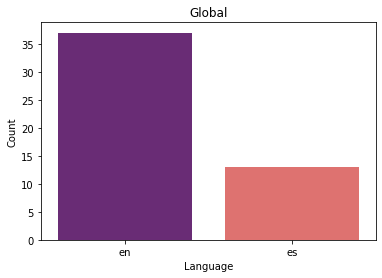

In [162]:
# Value counts for global languages 
sns.countplot(x='language', data=globalx, palette='magma')
plt.ylabel('Count')
plt.xlabel('Language')
plt.title('Global')

Text(0.5, 1.0, 'USA')

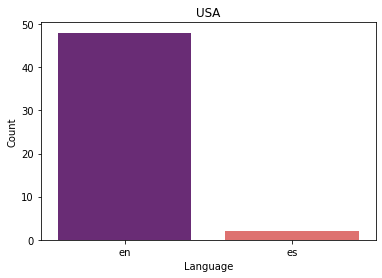

In [170]:
# Value counts for USA languages 
sns.countplot(x='language', data=usa, palette='magma')
plt.ylabel('Count')
plt.xlabel('Language')
plt.title('USA')

Text(0.5, 1.0, 'UK')

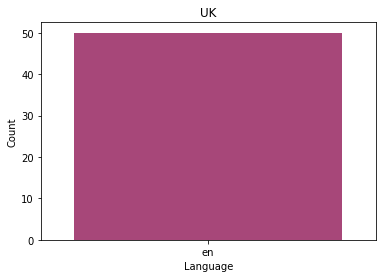

In [171]:
# Value counts for UK languages 
sns.countplot(x='language', data=uk, palette='magma')
plt.ylabel('Count')
plt.xlabel('Language')
plt.title('UK')

In [66]:
# Correcting two values 
brazil.language[21] = 'pt'
brazil.language[30] = 'pt'

Text(0.5, 1.0, 'Brazil')

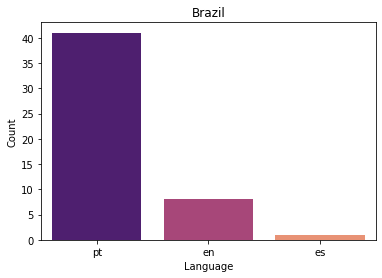

In [172]:
# Value counts for Brazil languages 
sns.countplot(x='language', data=brazil, palette='magma')
plt.ylabel('Count')
plt.xlabel('Language')
plt.title('Brazil')

In [70]:
# Correcting one value 
germany.language[19] = 'de'

Text(0.5, 1.0, 'Germany')

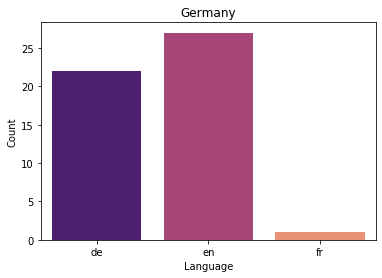

In [173]:
# Value counts for Germany languages 
sns.countplot(x='language', data=germany, palette='magma')
plt.ylabel('Count')
plt.xlabel('Language')
plt.title('Germany')

Text(0.5, 1.0, 'Spain')

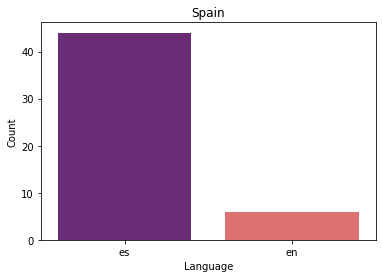

In [174]:
# Value counts for Spain languages 
sns.countplot(x='language', data=spain, palette='magma')
plt.ylabel('Count')
plt.xlabel('Language')
plt.title('Spain')

Text(0.5, 1.0, 'Mexico')

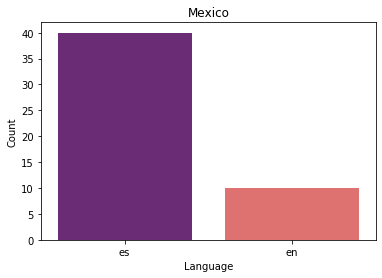

In [175]:
# Value counts for Mexico languages 
sns.countplot(x='language', data=mexico, palette='magma')
plt.ylabel('Count')
plt.xlabel('Language')
plt.title('Mexico')

Text(0.5, 1.0, 'Italy')

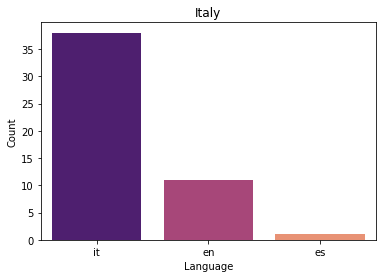

In [180]:
# Value counts for Italy languages 
sns.countplot(x='language', data=italy, palette='magma')
plt.ylabel('Count')
plt.xlabel('Language')
plt.title('Italy')

Text(0.5, 1.0, 'Philippines')

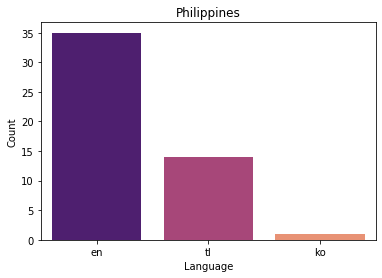

In [181]:
# Value counts for Philippines languages 
sns.countplot(x='language', data=philippines, palette='magma')
plt.ylabel('Count')
plt.xlabel('Language')
plt.title('Philippines')

Text(0.5, 1.0, 'Netherlands')

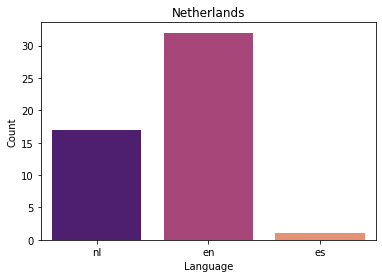

In [179]:
# Value counts for Netherlands languages 
sns.countplot(x='language', data=netherlands, palette='magma')
plt.ylabel('Count')
plt.xlabel('Language')
plt.title('Netherlands')

In [77]:
# Defining text cleaning function for preprocessing 
def clean_text(text):
    text = text.lower()
    text = re.sub('¡', '', text)
    text = re.sub('¿', '', text)
    text = re.sub('[%s]' % re.escape(string.punctuation), '', text)
    text = " ".join(lemmy.lemmatize(i) for i in text.split())
    return text

In [78]:
# Defining a lemmatizer object 
lemmy = WordNetLemmatizer()

In [79]:
# Creating columns for preprocessed text using the clean_text function 
globalx['preprocessed'] = globalx['en_translation'].apply(clean_text)
usa['preprocessed'] = usa['en_translation'].apply(clean_text)
uk['preprocessed'] = uk['en_translation'].apply(clean_text)
brazil['preprocessed'] = brazil['en_translation'].apply(clean_text)
germany['preprocessed'] = germany['en_translation'].apply(clean_text)
spain['preprocessed'] = spain['en_translation'].apply(clean_text)
mexico['preprocessed'] = mexico['en_translation'].apply(clean_text)
italy['preprocessed'] = italy['en_translation'].apply(clean_text)
philippines['preprocessed'] = philippines['en_translation'].apply(clean_text)
netherlands['preprocessed'] = netherlands['en_translation'].apply(clean_text)

In [80]:
# Defining stopwords for text preprocessing 
stopwords = nltk.corpus.stopwords.words('english')
en_stopwords_update = ['ive', 'im', 'itll', 'cant', 'youre', 'bout', 'oh', 'mmh', 'yeah', 'ooh', 'you\'re', 'ah',
                       'n****', 'n****s', 'ill', 'youll', 'ayy', 'shouldve','iÂ\x96', 'aint', 'id', 'blah', 'dont',
                       '\'em', 'it\'s', 'don\'t', 'rrr', 'o', 'ovy', 'brr', 'skrrt', 'woo', 'la', 'eh', 'wuh', 
                       'hey', 'wuh', 'theres', 'ayy', 'doo', 'huh', 'ah', 'shell', 'yah', 'tra', 'ya', 'mmm', 'mi',
                       'Â\x92', 'shh', 'Â\x80Â\x94', 'uh', 'é', 'turudum', 'aaaa', 'ai', 'doh', 'brrm', 'na', 
                       'oooh', 'rvfv', 'ao', 'ba', 'uh', 'yeh', 'ajajajay', 'ba', 'bu', 'ey', 'yeih', 'yah', 'uff',
                       'jah', 'pri', 'ra', 'rauw', 'ni', 'kyuh', 'bam', 'hmm', '\x82', 'ay', 'uah', 'wa', 'get', 'got', 'boh',
                       'doe', 'ha', 'pla', 'ku', 'toa', 'ta', 'isnt', 'toã­ta', 'l', 'bah', 'didnt', 'wont', 'nigga', 'niggas', 'u']
stopwords.extend(en_stopwords_update)

In [81]:
# Defining a function to remove stopwords 
def remove_stopwords(df): 
    core_text = []
    for i in range(len(df.song_title)): 
        text = df.preprocessed[i].split()
        stopwords = nltk.corpus.stopwords.words('english')
        text = [word for word in text if word not in stopwords]
        core_text.append(" ".join(text))
    return pd.Series(core_text)

In [83]:
# Applying stopword removal function to the preprocessed text 
globalx['preprocessed'] = remove_stopwords(globalx)
usa['preprocessed'] = remove_stopwords(usa)
uk['preprocessed'] = remove_stopwords(uk)
brazil['preprocessed'] = remove_stopwords(brazil)
germany['preprocessed'] = remove_stopwords(germany)
spain['preprocessed'] = remove_stopwords(spain)
mexico['preprocessed'] = remove_stopwords(mexico)
italy['preprocessed'] = remove_stopwords(italy)
philippines['preprocessed'] = remove_stopwords(philippines)
netherlands['preprocessed'] = remove_stopwords(netherlands)

In [84]:
# Creating new dataframe with all language values for all countries 
all_langs = pd.concat([globalx.language, 
                       usa.language,
                       uk.language,
                       brazil.language,
                       germany.language,
                       spain.language,
                       mexico.language,
                       italy.language,
                       philippines.language,
                       netherlands.language], axis=0).reset_index()
pd.set_option('display.max_rows', None)
all_langs.drop(['index'], axis=1, inplace=True)
all_langs

,language
0,en
1,en
2,en
3,en
4,en
5,en
6,en
7,en
8,es
9,en


In [85]:
# Replacing the values to avoid ambiguity 
all_langs.language.replace({'en': 'English', 'es': 'Spanish', 'pt': 'Portuguese', 'it': 'Italian', 'de': 'German',
                            'nl': 'Dutch', 'tl': 'Tagalog', 'ko': 'Korean', 'tr': 'Turkish'}, inplace=True)

Text(0.5, 0, 'Count')

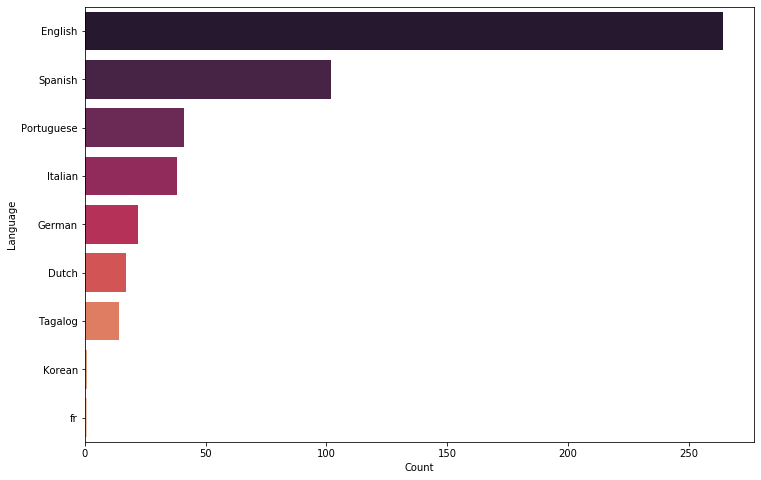

In [86]:
# Plotting the language values for all songs
plt.figure(figsize=(12,8))
sns.barplot(y=all_langs.language.value_counts().index, x=all_langs.language.value_counts(), 
            palette='rocket', orient='h')
plt.ylabel('Language')
plt.xlabel('Count')

In [87]:
# Joining all the preprocessed lyrics in one Series to create a corpus with all lyrics 
all_lyrics = pd.concat([globalx.preprocessed, 
                       usa.preprocessed,
                       uk.preprocessed,
                       brazil.preprocessed,
                       germany.preprocessed,
                       spain.preprocessed,
                       mexico.preprocessed,
                       italy.preprocessed,
                       philippines.preprocessed,
                       netherlands.preprocessed], axis=0).reset_index()
pd.set_option('display.max_rows', None)
all_lyrics.drop(['index'], axis=1, inplace=True)
all_lyrics

,preprocessed
0,yeah ive tryna call ive long enough maybe show...
1,dont wanna see full 180 crazy thinking bout wa...
2,pullin coupe lot told em fuck 12 fuck swat bus...
3,say oh god see way shine take hand dear place ...
4,rose walked corner body screaming dolo never s...
5,dont stay awake long dont go bed ill make cup ...
6,ive always one say first goodbye love lose hun...
7,day night morning keep moment id let known don...
8,blah blah blah blah blah blah hey yah lalalala...
9,common love isnt u created something phenomena...


In [88]:
# Defining a unigram function and creating new dataframe for the unigrams 
def get_top_n_words(corpus, n=None):
    vec = CountVectorizer(stop_words='english').fit(corpus)
    bag_of_words = vec.transform(corpus)
    sum_words = bag_of_words.sum(axis=0) 
    words_freq = [(word, sum_words[0, idx]) for word, idx in vec.vocabulary_.items()]
    words_freq =sorted(words_freq, key = lambda x: x[1], reverse=True)
    return words_freq[:n]

common_words = get_top_n_words(all_lyrics['preprocessed'], 25)
top_words_df = pd.DataFrame(common_words, columns = ['unigram' , 'count'])

In [90]:
# Plotting the unigram values 
fig = go.Figure([go.Bar(x=top_words_df['unigram'], y=top_words_df['count'])])
fig.update_layout(title=go.layout.Title(text="Top 25 unigrams in lyrics after text preprocessing"))
fig.show()

In [91]:
# Defining a bigram function and creating new dataframe for the bigrams 
def get_top_n_bigram(corpus, n=None):
    vec = CountVectorizer(ngram_range=(2, 2), stop_words='english').fit(corpus)
    bag_of_words = vec.transform(corpus)
    sum_words = bag_of_words.sum(axis=0) 
    words_freq = [(word, sum_words[0, idx]) for word, idx in vec.vocabulary_.items()]
    words_freq =sorted(words_freq, key = lambda x: x[1], reverse=True)
    return words_freq[:n]

common_words = get_top_n_bigram(all_lyrics['preprocessed'], 20)
top_bigrams_df = pd.DataFrame(common_words, columns = ['bigram' , 'count'])

In [93]:
# Plotting the bigram values 
fig = go.Figure([go.Bar(x=top_bigrams_df['bigram'], y=top_bigrams_df['count'])])
fig.update_layout(title=go.layout.Title(text="Top 20 bigrams in lyrics after text preprocessing"))
fig.show()

In [94]:
# Defining a trigram function and creating new dataframe for the trigrams 
def get_top_n_trigram(corpus, n=None):
    vec = CountVectorizer(ngram_range=(3, 3), stop_words='english').fit(corpus)
    bag_of_words = vec.transform(corpus)
    sum_words = bag_of_words.sum(axis=0) 
    words_freq = [(word, sum_words[0, idx]) for word, idx in vec.vocabulary_.items()]
    words_freq =sorted(words_freq, key = lambda x: x[1], reverse=True)
    return words_freq[:n]

common_words = get_top_n_trigram(all_lyrics['preprocessed'], 20)
top_trigram_df = pd.DataFrame(common_words, columns = ['trigram' , 'count'])

In [96]:
# Plotting the trigrams 
fig = go.Figure([go.Bar(x=top_trigram_df['trigram'], y=top_trigram_df['count'])])
fig.update_layout(title=go.layout.Title(text="Top 20 trigrams in lyrics after preprocessing"))
fig.show()

## Model Building

In this project, I played around with the topic modelling models and used Gensim and Scikit learn and also experimented with LDA vs. NMF and CountVectorizer vs. TF-IDF. With LDA I used Grid Search in Scikit learn to find the best parameters. Below are most of my workings and also my final results. For the LDA models, I have been able to use the pyLDAvis library to visualise the results. Whereas with NMF, I have had to just look at the top 20 or so terms for each topic extracted by the model. 

In [97]:
# Using Gensim for topic modelling 
all_tokens = [word_tokenize(lyric) for lyric in all_lyrics.preprocessed]
dictionary = corpora.Dictionary(all_tokens)
print(dictionary)

Dictionary(6772 unique tokens: ['around', 'baby', 'back', 'blinded', 'call']...)


In [98]:
# Creating the BoW doc term matrix 
doc_term_matrix = [dictionary.doc2bow(doc) for doc in all_tokens]

In [99]:
# Inspecting the doc_term_matrix 
corpora.MmCorpus.serialize('corpus_s.mm', doc_term_matrix)  
print (len(doc_term_matrix))
print (doc_term_matrix[100])

500
[(0, 3), (1, 2), (2, 2), (3, 4), (4, 1), (5, 6), (6, 1), (7, 2), (8, 2), (9, 2), (10, 1), (11, 1), (12, 1), (13, 2), (14, 2), (15, 1), (16, 1), (17, 4), (18, 1), (19, 1), (20, 2), (21, 9), (22, 1), (23, 11), (24, 2), (25, 2), (26, 2), (27, 3), (28, 5), (29, 2), (30, 1), (31, 1), (32, 1), (33, 2), (34, 1), (35, 2), (36, 2), (37, 7), (38, 4), (39, 7), (40, 1), (41, 2), (42, 1), (43, 1), (44, 6), (45, 2), (46, 3), (47, 1), (48, 1), (49, 1), (50, 4), (51, 1), (52, 2), (53, 5), (54, 2), (55, 1), (56, 1), (57, 1), (58, 1), (59, 4)]


In [100]:
# Building the model 
Lda = gensim.models.ldamodel.LdaModel
ldamodel = Lda(doc_term_matrix, num_topics=10, id2word = dictionary, passes=50)

In [101]:
# Creating the object for the LDA vis 
pyLDAvis.enable_notebook()
d = dictionary
c = gensim.corpora.MmCorpus('corpus_s.mm')
lda = ldamodel

In [102]:
# Displaying 10 topics and 10 words per topic 
ldamodel.print_topics()   

[(0,
  '0.027*"na" + 0.025*"dont" + 0.018*"bed" + 0.016*"hey" + 0.014*"go" + 0.014*"stay" + 0.012*"going" + 0.012*"want" + 0.012*"long" + 0.011*"head"'),
 (1,
  '0.030*"hey" + 0.021*"want" + 0.018*"dont" + 0.016*"im" + 0.015*"love" + 0.014*"yes" + 0.014*"know" + 0.010*"one" + 0.010*"eh" + 0.010*"go"'),
 (2,
  '0.022*"wa" + 0.018*"yeah" + 0.016*"make" + 0.013*"best" + 0.012*"got" + 0.011*"like" + 0.010*"good" + 0.010*"hey" + 0.010*"uah" + 0.010*"believe"'),
 (3,
  '0.028*"wa" + 0.024*"im" + 0.019*"cause" + 0.018*"one" + 0.017*"heart" + 0.016*"love" + 0.013*"never" + 0.013*"could" + 0.012*"home" + 0.012*"go"'),
 (4,
  '0.036*"come" + 0.021*"know" + 0.019*"baby" + 0.017*"ill" + 0.016*"like" + 0.016*"let" + 0.015*"love" + 0.015*"dont" + 0.014*"got" + 0.014*"get"'),
 (5,
  '0.050*"yeah" + 0.038*"im" + 0.015*"bitch" + 0.015*"dont" + 0.014*"ah" + 0.014*"oh" + 0.014*"know" + 0.011*"roxanne" + 0.011*"na" + 0.010*"like"'),
 (6,
  '0.128*"la" + 0.054*"dont" + 0.036*"im" + 0.035*"na" + 0.022*"lone

In [103]:
# Creaating a function to show the topics defined by the models 
def show_topics(vectorizer, lda_model, n_words=20):
    keywords = np.array(vectorizer.get_feature_names())
    topic_keywords = []
    for topic_weights in lda_model.components_:
        top_keyword_locs = (-topic_weights).argsort()[:n_words]
        topic_keywords.append(keywords.take(top_keyword_locs))
    return topic_keywords

In [105]:
# Visualising the results of the Gensim LDA model. As we can see they aren't great.  
gensim_topics = pyLDAvis.gensim.prepare(lda, c, d)
gensim_topics

PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
7     -0.076356 -0.168549       1        1  14.599964
9      0.062463  0.032408       2        1  14.092289
4      0.006294 -0.053324       3        1  13.966735
1      0.069750  0.055044       4        1  12.824753
5     -0.055878 -0.038732       5        1   9.492331
3      0.090990 -0.098210       6        1   8.084714
0     -0.005274  0.046088       7        1   7.800116
2      0.081290 -0.035495       8        1   7.716754
6     -0.247275  0.086509       9        1   6.843375
8      0.073994  0.174262      10        1   4.578971, topic_info=     Category         Freq              Term        Total  loglift  logprob
521   Default  1002.000000                la  1002.000000  30.0000  30.0000
37    Default  1816.000000                oh  1816.000000  29.0000  29.0000
82    Default   846.000000                na   846.000000  28.0000  28.0000
12    Default  1709.000000              dont  1709.000000  27.0000  27.0000
23    Default  1944.000000                im  1944.000000  26.0000  26.0000
58    Default  1581.000000              yeah  1581.000000  25.0000  25.0000
21    Default   836.000000               hey   836.000000  24.0000  24.0000
70    Default   883.000000              come   883.000000  23.0000  23.0000
93    Default   812.000000                wa   812.000000  22.0000  22.0000
921   Default   171.000000            lonely   171.000000  21.0000  21.0000
462   Default   251.000000               yah   251.000000  20.0000  20.0000
144   Default   978.000000               got   978.000000  19.0000  19.0000
1270  Default   181.000000               doo   181.000000  18.0000  18.0000
110   Default   454.000000             bitch   454.000000  17.0000  17.0000
298   Default   229.000000               bed   229.000000  16.0000  16.0000
167   Default   324.000000              move   324.000000  15.0000  15.0000
605   Default   173.000000          physical   173.000000  14.0000  14.0000
151   Default   467.000000               ill   467.000000  13.0000  13.0000
95    Default   435.000000               wan   435.000000  12.0000  12.0000
64    Default   370.000000              away   370.000000  11.0000  11.0000
377   Default   319.000000             heart   319.000000  10.0000  10.0000
754   Default   312.000000                uh   312.000000   9.0000   9.0000
94    Default   226.000000              walk   226.000000   8.0000   8.0000
230   Default   594.000000                ah   594.000000   7.0000   7.0000
583   Default   288.000000               yes   288.000000   6.0000   6.0000
692   Default   391.000000              give   391.000000   5.0000   5.0000
894   Default   117.000000           roxanne   117.000000   4.0000   4.0000
500   Default   428.000000                eh   428.000000   3.0000   3.0000
299   Default   148.000000              best   148.000000   2.0000   2.0000
235   Default   367.000000             dance   367.000000   1.0000   1.0000
1504   Topic1    92.425964           monster    93.266014   1.9151  -5.1698
199    Topic1    46.260063             slatt    47.100037   1.9062  -5.8620
1440   Topic1    37.603977          godzilla    38.443924   1.9021  -6.0691
649    Topic1    35.680241           mention    36.520153   1.9009  -6.1217
734    Topic1    32.793640               hoe    33.633801   1.8989  -6.2060
133    Topic1    30.870739             draco    31.710922   1.8973  -6.2664
621    Topic1    29.907696             bread    30.747850   1.8964  -6.2981
636    Topic1    28.947844            filter    29.787748   1.8955  -6.3308
3886   Topic1    28.947504              brrm    29.787401   1.8955  -6.3308
644    Topic1    28.947010            killer    29.786966   1.8955  -6.3308
123    Topic1    27.986006             coupe    28.825935   1.8946  -6.3646
153    Topic1    26.061277               key    26.901241   1.8924  -6.4358
218    Topic1    25.100483           trap

In [106]:
# Building the LDA model with scikit learn 
vectorizer = CountVectorizer(analyzer='word',       
                             min_df=3,                        
                             token_pattern='[a-zA-Z0-9]{2,}', 
                             max_features=5000,             
                            )

data_vectorized = vectorizer.fit_transform(all_lyrics['preprocessed'])

lda_model = LatentDirichletAllocation(n_components=20, 
                                      learning_method='online',
                                      random_state=0,       
                                      n_jobs = -1  
                                     )
lda_output = lda_model.fit_transform(data_vectorized)

In [107]:
# Visualising the results of LDA with Scikit learn. We can see there is greater topic separation but too many topics 
pyLDAvis.enable_notebook()
sklearn_topics = pyLDAvis.sklearn.prepare(lda_model, data_vectorized, vectorizer, mds='tsne')
sklearn_topics

PreparedData(topic_coordinates=                x           y  topics  cluster       Freq
topic                                                    
8      -10.878068   10.538728       1        1  32.431716
14     -60.884026  -75.591820       2        1   9.372337
10      -2.336119  -53.289074       3        1   6.731029
11     -61.385319  -12.914634       4        1   6.484713
12     -28.737743  126.296997       5        1   5.712153
4        1.066606 -123.552811       6        1   5.495809
1       45.140720   -7.947869       7        1   5.444551
5     -140.795975  -98.530548       8        1   4.963771
2       61.531681  -83.240562       9        1   3.741664
3      -72.563057 -140.396881      10        1   3.485373
9       15.984491   63.578186      11        1   3.273817
15    -160.851624   68.945145      12        1   2.949234
13      85.961830   51.922935      13        1   2.369303
16     -99.020836  109.936348      14        1   2.202942
6     -176.764130   -8.681684      15        1   2.146524
7     -117.189880  -37.420200      16        1   1.226082
17     108.829918  -22.946203      17        1   0.976774
19      47.588097  121.934814      18        1   0.495720
0     -106.467834   30.176889      19        1   0.471611
18     -50.613804   59.328842      20        1   0.024877, topic_info=     Category         Freq              Term        Total  loglift  logprob
1284  Default  1082.000000                la  1082.000000  30.0000  30.0000
1642  Default  1883.000000                oh  1883.000000  29.0000  29.0000
2716  Default  1629.000000              yeah  1629.000000  28.0000  28.0000
44    Default   624.000000                ah   624.000000  27.0000  27.0000
495   Default   897.000000              come   897.000000  26.0000  26.0000
1175  Default  1966.000000                im  1966.000000  25.0000  25.0000
2581  Default   840.000000                wa   840.000000  24.0000  24.0000
1278  Default  1470.000000              know  1470.000000  23.0000  23.0000
1174  Default   469.000000               ill   469.000000  22.0000  22.0000
149   Default   447.000000              back   447.000000  21.0000  21.0000
974   Default   284.000000              girl   284.000000  20.0000  20.0000
1649  Default   787.000000               one   787.000000  19.0000  19.0000
1101  Default   851.000000               hey   851.000000  18.0000  18.0000
1345  Default  1376.000000              like  1376.000000  17.0000  17.0000
1401  Default   948.000000              love   948.000000  16.0000  16.0000
984   Default   998.000000                go   998.000000  15.0000  15.0000
1958  Default   211.000000             right   211.000000  14.0000  14.0000
2597  Default   933.000000              want   933.000000  13.0000  13.0000
2393  Default   292.000000             thing   292.000000  12.0000  12.0000
1328  Default   616.000000               let   616.000000  11.0000  11.0000
2500  Default   295.000000              turn   295.000000  10.0000  10.0000
683   Default   171.000000               doo   171.000000   9.0000   9.0000
2720  Default   297.000000               yes   297.000000   8.0000   8.0000
1086  Default   331.000000             heart   331.000000   7.0000   7.0000
1003  Default   795.000000               got   795.000000   6.0000   6.0000
1590  Default   672.000000             never   672.000000   5.0000   5.0000
402   Default   530.000000             cause   530.000000   4.0000   4.0000
1565  Default   359.000000                na   359.000000   3.0000   3.0000
2032  Default   678.000000               say   678.000000   2.0000   2.0000
966   Default   752.000000               get   752.000000   1.0000   1.0000
2215   Topic1    94.753055              soul    96.034655   1.1126  -5.8495
295    Topic1    72.002807               box    73.232663   1.1091  -6.1240
2446   Topic1    79.200147           tonight    80.578483   1.1088  -6.0288
391    Topic1    55.213740            caring    56.355033   1.1056  -6.3895
2166   Topic1    44.9

In [108]:
# Show the words for each topic extracted with the function defined above in a new dataframe 
lda_topic_keywords = show_topics(vectorizer=vectorizer, lda_model=lda_model, n_words=15)        

df_lda_topic_keywords = pd.DataFrame(lda_topic_keywords)
df_lda_topic_keywords.columns = ['Word '+str(i) for i in range(df_lda_topic_keywords.shape[1])]
df_lda_topic_keywords.index = ['Topic '+str(i) for i in range(df_lda_topic_keywords.shape[0])]
df_lda_topic_keywords

,Word 0,Word 1,Word 2,Word 3,Word 4,Word 5,Word 6,Word 7,Word 8,Word 9,Word 10,Word 11,Word 12,Word 13,Word 14
Topic 0,girl,right,ima,ya,body,hit,put,hand,roll,lighter,higher,fire,vibe,ahh,comin
Topic 1,yeah,im,got,need,dont,like,bitch,make,babe,way,aint,drop,man,bos,gotta
Topic 2,im,like,monster,fire,get,yeah,floor,dance,em,godzilla,carpet,louis,blood,bitch,got
Topic 3,wa,heart,one,home,cause,love,falling,break,stayed,could,go,said,better,hello,end
Topic 4,want,na,wa,one,uah,ah,another,eh,love,give,doe,ay,yeh,time,shot
Topic 5,hey,yah,like,know,bang,dont,bam,doesnt,four,time,good,gang,brr,tail,going
Topic 6,day,feeling,good,gotta,okay,around,get,ayy,best,someone,like,way,never,somebody,kinda
Topic 7,ah,ever,thing,ill,fire,honey,id,let,walk,adore,like,oh,loose,ooh,say
Topic 8,dont,im,know,love,oh,like,yeah,want,go,never,away,baby,wa,come,feel
Topic 9,yes,keep,want,say,alone,hey,dont,let,even,didnt,day,morning,like,got,night


In [109]:
# LDA with scikit learn and fewer topics. 
vectorizer2 = CountVectorizer(analyzer='word',       
                             min_df=3,                        # minimum required occurences of a word 
                             token_pattern='[a-zA-Z0-9]{2,}',  # num chars > 3
                             max_features=5000,             # max number of unique words. Build a vocabulary that only consider the top max_features ordered by term frequency across the corpus
                            )

data_vectorized2 = vectorizer2.fit_transform(all_lyrics['preprocessed'])

lda_model2 = LatentDirichletAllocation(n_components=10,
                                      learning_method='online',
                                      random_state=0,       
                                      n_jobs = -1 
                                     )
lda_output2 = lda_model2.fit_transform(data_vectorized2)

In [110]:
# Visualising the results of the new LDA model. Still too many topics
pyLDAvis.enable_notebook()
sklearn_topics2 = pyLDAvis.sklearn.prepare(lda_model2, data_vectorized2, vectorizer2, mds='tsne')
sklearn_topics2

PreparedData(topic_coordinates=               x          y  topics  cluster       Freq
topic                                                  
8      32.420952   8.115230       1        1  35.904398
4       0.648955  71.707100       2        1  14.830327
5      71.019684   9.971006       3        1  11.884528
1       3.785981  33.185135       4        1  11.333987
2     -42.666500  -9.222070       5        1   6.859516
6      -3.621689 -43.526516       6        1   5.603096
9      -3.632402  -4.171708       7        1   5.446837
3     -36.584400  35.804413       8        1   5.270752
0      44.391380  50.615383       9        1   1.479957
7      40.235809 -31.591665      10        1   1.386602, topic_info=     Category         Freq          Term        Total  loglift  logprob
44    Default   603.000000            ah   603.000000  30.0000  30.0000
1642  Default  1809.000000            oh  1809.000000  29.0000  29.0000
495   Default   935.000000          come   935.000000  28.0000  28.0000
1174  Default   464.000000           ill   464.000000  27.0000  27.0000
2716  Default  1634.000000          yeah  1634.000000  26.0000  26.0000
2393  Default   282.000000         thing   282.000000  25.0000  25.0000
1284  Default  1055.000000            la  1055.000000  24.0000  24.0000
1328  Default   622.000000           let   622.000000  23.0000  23.0000
1599  Default   402.000000         night   402.000000  22.0000  22.0000
2581  Default   843.000000            wa   843.000000  21.0000  21.0000
1345  Default  1381.000000          like  1381.000000  20.0000  20.0000
1175  Default  1950.000000            im  1950.000000  19.0000  19.0000
1278  Default  1470.000000          know  1470.000000  18.0000  18.0000
1101  Default   860.000000           hey   860.000000  17.0000  17.0000
1003  Default   812.000000           got   812.000000  16.0000  16.0000
682   Default  1754.000000          dont  1754.000000  15.0000  15.0000
739   Default   457.000000            eh   457.000000  14.0000  14.0000
782   Default   156.000000          ever   156.000000  13.0000  13.0000
1651  Default   502.000000           ooh   502.000000  12.0000  12.0000
148   Default   693.000000          baby   693.000000  11.0000  11.0000
1086  Default   331.000000         heart   331.000000  10.0000  10.0000
966   Default   759.000000           get   759.000000   9.0000   9.0000
2720  Default   303.000000           yes   303.000000   8.0000   8.0000
239   Default   456.000000         bitch   456.000000   7.0000   7.0000
2588  Default   229.000000          walk   229.000000   6.0000   6.0000
1958  Default   214.000000         right   214.000000   5.0000   5.0000
1565  Default   363.000000            na   363.000000   4.0000   4.0000
2032  Default   671.000000           say   671.000000   3.0000   3.0000
878   Default   174.000000          fire   174.000000   2.0000   2.0000
2597  Default   944.000000          want   944.000000   1.0000   1.0000
2215   Topic1    94.430196          soul    95.554434   1.0125  -5.9546
1456   Topic1   116.392676         maybe   117.824112   1.0121  -5.7455
295    Topic1    71.764202           box    72.846616   1.0093  -6.2291
1284   Topic1  1038.911819            la  1055.774756   1.0082  -3.5565
391    Topic1    55.017639        caring    56.045583   1.0058  -6.4948
253    Topic1    49.972580         blind    51.030141   1.0034  -6.5910
2166   Topic1    44.839498         slatt    45.890065   1.0012  -6.6994
621    Topic1    41.422455        define    42.471065   0.9993  -6.7786
203    Topic1    41.260874           beg    42.378241   0.9976  -6.7826
254    Topic1    37.585606       blinded    38.607438   0.9975  -6.8758
2474   Topic1    35.968853         treat    37.019750   0.9955  -6.9198
1379   Topic1   164.056198        lonely   168.944146   0.9950  -5.4023
611    Topic1    35.667629          dear    36.757767   0.9942  -6.9282
2011   Topic1    35.761890           sad    36.942372   0.9918  -6.9256
473    Topic1    31.467433        closer    3

In [111]:
# Show the words for each topic extracted with the function defined above in a new dataframe 
lda_topic_keywords2 = show_topics(vectorizer=vectorizer2, lda_model=lda_model2, n_words=15)        

df_lda_topic_keywords2 = pd.DataFrame(lda_topic_keywords2)
df_lda_topic_keywords2.columns = ['Word '+str(i) for i in range(df_lda_topic_keywords2.shape[1])]
df_lda_topic_keywords2.index = ['Topic '+str(i) for i in range(df_lda_topic_keywords2.shape[0])]
df_lda_topic_keywords2

,Word 0,Word 1,Word 2,Word 3,Word 4,Word 5,Word 6,Word 7,Word 8,Word 9,Word 10,Word 11,Word 12,Word 13,Word 14
Topic 0,rhythm,night,boh,extreme,flex,right,oh,yeah,girl,ima,ya,negro,baby,body,fire
Topic 1,yeah,im,got,like,dont,bitch,need,aint,roxanne,make,get,way,wanna,man,babe
Topic 2,come,im,got,physical,like,get,let,dont,monster,know,believe,best,baby,keep,fire
Topic 3,wa,know,turn,heart,home,falling,one,cause,love,stayed,could,break,hello,baby,end
Topic 4,eh,hey,na,want,give,doo,one,wa,tell,go,ha,come,love,know,yeh
Topic 5,hey,yeah,yah,go,want,like,oh,im,ah,know,dont,uh,move,one,three
Topic 6,dont,bed,get,make,long,go,going,stay,day,head,ill,uh,feeling,yeah,itll
Topic 7,ah,thing,ever,ill,fire,honey,let,walk,id,adore,oh,like,ooh,loose,say
Topic 8,oh,la,im,dont,know,love,yeah,never,like,see,make,youre,ooh,baby,away
Topic 9,yes,keep,bitch,want,woo,say,like,got,let,alone,im,dont,even,day,didnt


In [112]:
# Experimenting with LDA and TF-IDF 
lda_tfidf_vectorizer = TfidfVectorizer(max_df=0.95, min_df=2,
                                   max_features=4000,
                                   stop_words='english')

lda_tfidf_vectorized = lda_tfidf_vectorizer.fit_transform(all_lyrics['preprocessed'])

lda_model_tfidf = LatentDirichletAllocation(n_components=10,
                                            learning_method='online',
                                            random_state=0,       
                                            n_jobs = -1
                                            )
lda_output3 = lda_model_tfidf.fit_transform(lda_tfidf_vectorized)

In [113]:
# Visualising the results. As can be seen the topic size is way more imbalanced with TF-IDF 
pyLDAvis.enable_notebook()
sklearn_topics3 = pyLDAvis.sklearn.prepare(lda_model_tfidf, lda_tfidf_vectorized, lda_tfidf_vectorizer, mds='tsne')
sklearn_topics3

PreparedData(topic_coordinates=               x          y  topics  cluster       Freq
topic                                                  
8      32.420952   8.115230       1        1  62.006671
4       0.648955  71.707100       2        1  10.416795
1      71.019684   9.971006       3        1   6.691476
6       3.785981  33.185135       4        1   5.284248
2     -42.666500  -9.222070       5        1   4.466106
9      -3.621689 -43.526516       6        1   3.550046
7      -3.632402  -4.171708       7        1   2.794359
3     -36.584400  35.804413       8        1   1.775347
5      44.391380  50.615383       9        1   1.529835
0      40.235809 -31.591665      10        1   1.485118, topic_info=     Category       Freq           Term      Total  loglift  logprob
2097  Default  19.000000             oh  19.000000  30.0000  30.0000
1663  Default   7.000000             la   7.000000  29.0000  29.0000
901   Default  15.000000           dont  15.000000  28.0000  28.0000
253   Default   3.000000            bed   3.000000  27.0000  27.0000
1422  Default  13.000000            hey  13.000000  26.0000  26.0000
2110  Default   7.000000            ooh   7.000000  25.0000  25.0000
1509  Default  15.000000             im  15.000000  24.0000  24.0000
180   Default   6.000000           away   6.000000  23.0000  23.0000
3209  Default   3.000000           turn   3.000000  22.0000  22.0000
763   Default   4.000000          dance   4.000000  21.0000  21.0000
1834  Default   9.000000           make   9.000000  20.0000  20.0000
1449  Default   3.000000           home   3.000000  19.0000  19.0000
3311  Default   9.000000             wa   9.000000  18.0000  18.0000
190   Default   9.000000           baby   9.000000  17.0000  17.0000
1655  Default  13.000000           know  13.000000  16.0000  16.0000
1508  Default   5.000000            ill   5.000000  15.0000  15.0000
1403  Default   5.000000          heart   5.000000  14.0000  14.0000
2604  Default   5.000000           said   5.000000  13.0000  13.0000
3482  Default   6.000000          youre   6.000000  12.0000  12.0000
1108  Default   6.000000           feel   6.000000  11.0000  11.0000
3320  Default   4.000000           walk   4.000000  10.0000  10.0000
1395  Default   3.000000           head   3.000000   9.0000   9.0000
2628  Default   6.000000            say   6.000000   8.0000   8.0000
1717  Default   8.000000            let   8.000000   7.0000   7.0000
1080  Default   2.000000        falling   2.000000   6.0000   6.0000
385   Default   3.000000          break   3.000000   5.0000   5.0000
3330  Default  12.000000           want  12.000000   4.0000   4.0000
509   Default   6.000000          cause   6.000000   3.0000   3.0000
845   Default   4.000000          didnt   4.000000   2.0000   2.0000
184   Default   4.000000            ayy   4.000000   1.0000   1.0000
973    Topic1   7.917325             eh   8.181759   0.4451  -5.3946
3474   Topic1   5.211777            yes   5.466557   0.4302  -5.8127
2236   Topic1   4.703691       physical   4.934641   0.4300  -5.9153
3470   Topic1   3.822029            yeh   4.055673   0.4186  -6.1229
3330   Topic1  11.520692           want  12.231039   0.4181  -5.0195
1343   Topic1   4.975124             ha   5.283055   0.4179  -5.8592
890    Topic1   3.778284         doesnt   4.020926   0.4157  -6.1344
3457   Topic1   3.626067            wuh   3.864685   0.4142  -6.1755
2007   Topic1   4.214804             na   4.493039   0.4140  -6.0250
3225   Topic1   5.404615             uh   5.775697   0.4115  -5.7764
3461   Topic1   4.986417            yah   5.333981   0.4105  -5.8569
2101   Topic1   3.409580           okay   3.653386   0.4089  -6.2371
924    Topic1   3.499186          drink   3.761100   0.4057  -6.2111
1845   Topic1   3.212583            man   3.459783   0.4038  -6.2966
1058   Topic1   2.987174             ey   3.219087   0.4032  -6.3693
889    Topic1   3.261833            doe   3.516956   0.4026  -6.2814
1641   Topic1   2.930156           kiss   

In [114]:
# Show the words for each topic extracted with the function defined above in a new dataframe 
lda_topic_keywords2 = show_topics(vectorizer=vectorizer2, lda_model=lda_model2, n_words=15)        

df_lda_topic_keywords2 = pd.DataFrame(lda_topic_keywords2)
df_lda_topic_keywords2.columns = ['Word '+str(i) for i in range(df_lda_topic_keywords2.shape[1])]
df_lda_topic_keywords2.index = ['Topic '+str(i) for i in range(df_lda_topic_keywords2.shape[0])]
df_lda_topic_keywords2

,Word 0,Word 1,Word 2,Word 3,Word 4,Word 5,Word 6,Word 7,Word 8,Word 9,Word 10,Word 11,Word 12,Word 13,Word 14
Topic 0,rhythm,night,boh,extreme,flex,right,oh,yeah,girl,ima,ya,negro,baby,body,fire
Topic 1,yeah,im,got,like,dont,bitch,need,aint,roxanne,make,get,way,wanna,man,babe
Topic 2,come,im,got,physical,like,get,let,dont,monster,know,believe,best,baby,keep,fire
Topic 3,wa,know,turn,heart,home,falling,one,cause,love,stayed,could,break,hello,baby,end
Topic 4,eh,hey,na,want,give,doo,one,wa,tell,go,ha,come,love,know,yeh
Topic 5,hey,yeah,yah,go,want,like,oh,im,ah,know,dont,uh,move,one,three
Topic 6,dont,bed,get,make,long,go,going,stay,day,head,ill,uh,feeling,yeah,itll
Topic 7,ah,thing,ever,ill,fire,honey,let,walk,id,adore,oh,like,ooh,loose,say
Topic 8,oh,la,im,dont,know,love,yeah,never,like,see,make,youre,ooh,baby,away
Topic 9,yes,keep,bitch,want,woo,say,like,got,let,alone,im,dont,even,day,didnt


In [115]:
# Using an NMF model from the scikit learn library 
n_features = 4000
n_components = 20
n_top_words = 20

tfidf_vectorizer = TfidfVectorizer(max_df=0.95, min_df=2,
                                   max_features=4000,
                                   stop_words='english')

tfidf = tfidf_vectorizer.fit_transform(all_lyrics['preprocessed'].values.astype(str))

nmf = NMF(n_components=20, random_state=1, alpha=.1, l1_ratio=.5).fit(tfidf)
nmf_output = nmf.fit_transform(tfidf)

In [116]:
# Show the words for each topic extracted with the function defined above in a new dataframe 
nmf_topic_keywords = show_topics(vectorizer=tfidf_vectorizer, lda_model=nmf, n_words=15)        

df_nmf_topic_keywords = pd.DataFrame(nmf_topic_keywords)
df_nmf_topic_keywords.columns = ['Word '+str(i) for i in range(df_nmf_topic_keywords.shape[1])]
df_nmf_topic_keywords.index = ['Topic '+str(i) for i in range(df_nmf_topic_keywords.shape[0])]
df_nmf_topic_keywords

,Word 0,Word 1,Word 2,Word 3,Word 4,Word 5,Word 6,Word 7,Word 8,Word 9,Word 10,Word 11,Word 12,Word 13,Word 14
Topic 0,dont,walk,caring,away,start,wanna,come,bout,somebody,believe,im,dancing,moved,left,stop
Topic 1,oh,dance,ayy,ooh,make,say,anybody,beg,ive,seen,thing,ah,ill,time,youre
Topic 2,la,lonely,ya,im,loser,quitter,thinkin,drinkin,ive,shouldve,long,youre,fucked,shouldnt,mmh
Topic 3,stayed,falling,home,heart,break,wa,wouldve,letting,hello,shouldve,cause,knew,better,said,end
Topic 4,hey,eh,want,yah,yeh,wuh,crazy,know,ha,dont,love,tell,baby,come,ah
Topic 5,yeah,im,bitch,like,shit,got,aint,band,thats,big,want,lil,dont,boom,baby
Topic 6,physical,come,agree,got,let,dancing,phy,riot,noise,choice,hold,follow,baby,tighter,dont
Topic 7,hey,ooh,blinded,im,said,touch,light,sleep,oh,judge,clearly,drowning,youre,feel,phone
Topic 8,bed,coffee,awake,itll,cup,head,dont,long,stay,ill,make,going,asleep,praying,youll
Topic 9,felt,ya,ill,closer,treat,feel,saw,baby,right,love,try,think,need,break,exception


In [117]:
# Changing the number of topics in the NMF model 
n_features = 4000
n_components = 10
n_top_words = 20

tfidf_vectorizer2 = TfidfVectorizer(max_df=0.95, min_df=2,
                                    max_features=4000,
                                    stop_words='english')

tfidf2 = tfidf_vectorizer2.fit_transform(all_lyrics['preprocessed'].values.astype(str))

nmf2 = NMF(n_components=10, random_state=1, alpha=.1, l1_ratio=.5).fit(tfidf2)
nmf_output2 = nmf.fit_transform(tfidf2)

In [118]:
# Show the words for each topic extracted with the function defined above in a new dataframe 
nmf_topic_keywords2 = show_topics(vectorizer=tfidf_vectorizer2, lda_model=nmf2, n_words=15)        

df_nmf_topic_keywords2 = pd.DataFrame(nmf_topic_keywords2)
df_nmf_topic_keywords2.columns = ['Word '+str(i) for i in range(df_nmf_topic_keywords2.shape[1])]
df_nmf_topic_keywords2.index = ['Topic '+str(i) for i in range(df_nmf_topic_keywords2.shape[0])]
df_nmf_topic_keywords2

,Word 0,Word 1,Word 2,Word 3,Word 4,Word 5,Word 6,Word 7,Word 8,Word 9,Word 10,Word 11,Word 12,Word 13,Word 14
Topic 0,dont,walk,away,caring,start,wanna,come,bout,somebody,im,believe,dancing,moved,left,scary
Topic 1,oh,dance,ayy,ooh,say,make,eye,ive,anybody,beg,thing,ah,ill,seen,define
Topic 2,la,lonely,im,ya,quitter,loser,thinkin,drinkin,ive,shouldve,fucked,youre,long,shouldnt,guess
Topic 3,stayed,falling,home,break,wouldve,heart,letting,wa,hello,shouldve,cause,knew,better,said,end
Topic 4,yeah,want,know,dont,im,like,hey,love,eh,baby,tell,got,wa,make,let
Topic 5,box,slatt,em,soul,told,gotta,fuck,got,bustin,swat,sucked,mojo,wipe,bell,app
Topic 6,physical,come,agree,got,let,dancing,riot,phy,noise,choice,hold,follow,baby,tighter,light
Topic 7,hey,ooh,blinded,im,touch,light,said,sleep,oh,judge,clearly,drowning,youre,feel,phone
Topic 8,bed,coffee,awake,itll,cup,head,dont,long,stay,ill,make,going,asleep,praying,youll
Topic 9,felt,ill,ya,closer,treat,saw,feel,baby,right,try,love,think,need,break,exception


In [119]:
# Experimenting with CountVectorizer and NMF 
n_features = 4000
n_components = 10
n_top_words = 20

tf_vectorizer = CountVectorizer(max_df=0.95, min_df=2,
                                max_features=n_features,
                                stop_words='english')

nmf_vectorized = tf_vectorizer.fit_transform(all_lyrics['preprocessed'].values.astype(str))

nmf3 = NMF(n_components=10, random_state=1, alpha=.1, l1_ratio=.5).fit(nmf_vectorized)
nmf_output3 = nmf.fit_transform(nmf_vectorized)

In [120]:
# Show the words for each topic extracted with the function defined above in a new dataframe 
nmf_topic_keywords3 = show_topics(vectorizer=tf_vectorizer, lda_model=nmf3, n_words=15)        

df_nmf_topic_keywords3 = pd.DataFrame(nmf_topic_keywords3)
df_nmf_topic_keywords3.columns = ['Word '+str(i) for i in range(df_nmf_topic_keywords3.shape[1])]
df_nmf_topic_keywords3.index = ['Topic '+str(i) for i in range(df_nmf_topic_keywords3.shape[0])]
df_nmf_topic_keywords3

,Word 0,Word 1,Word 2,Word 3,Word 4,Word 5,Word 6,Word 7,Word 8,Word 9,Word 10,Word 11,Word 12,Word 13,Word 14
Topic 0,im,like,bitch,monster,got,shit,ima,dont,aint,em,floor,bos,dance,cause,shine
Topic 1,la,lonely,youre,im,breaking,ive,know,ya,long,guess,quitter,loser,thinkin,drinkin,shouldve
Topic 2,oh,ooh,dance,ayy,ah,say,make,thing,youre,ill,ive,time,love,eye,seen
Topic 3,come,physical,got,let,dont,baby,agree,know,dancing,like,hold,night,ill,light,follow
Topic 4,na,dance,baby,shine,beautiful,moon,going,stop,let,party,today,flow,stay,nicky,excuse
Topic 5,yeah,babe,yummy,got,night,yum,way,roxanne,thats,uh,say,need,baby,youre,shit
Topic 6,hey,eh,yah,want,ah,like,wuh,crazy,ha,today,going,bum,time,tra,yeh
Topic 7,dont,away,make,know,bed,wanna,im,walk,start,stay,ill,head,going,long,caring
Topic 8,know,wa,love,want,like,baby,heart,cause,break,home,stayed,turn,falling,said,tell
Topic 9,doo,bring,memory,yeah,ayy,cause,drink,toast,say,lost,everybody,hurt,ooh,youre,got


In [121]:
# Defining a function so we can get more intensive with the text preprocessing and only look at nouns and verbs in the text corpus 
def nouns_n_verbs(text):
    '''Given a string of text, tokenize the text and pull out only the nouns n verbs.'''
    is_noun = lambda pos: pos[:2] == 'NN'
    is_verb = lambda pos: pos[:2] == 'VB'
    is_verbd = lambda pos: pos[:3] == 'VBD'
    is_verbg = lambda pos: pos[:3] == 'VBG'
    is_verbn = lambda pos: pos[:3] == 'VBN'
    tokenized = word_tokenize(text)
    all_nouns_n_verbs = [word for (word, pos) in pos_tag(tokenized) if is_noun(pos)] 
    all_nouns_n_verbs += [word for (word, pos) in pos_tag(tokenized) if is_verb(pos)]
    all_nouns_n_verbs += [word for (word, pos) in pos_tag(tokenized) if is_verbd(pos)]
    all_nouns_n_verbs += [word for (word, pos) in pos_tag(tokenized) if is_verbg(pos)]
    all_nouns_n_verbs += [word for (word, pos) in pos_tag(tokenized) if is_verbn(pos)]
    return ' '.join(all_nouns_n_verbs)

In [122]:
# Creating a new Series with all the newly preprocessed text 
nouns_df = pd.DataFrame(all_lyrics.preprocessed.apply(nouns_n_verbs))
nouns_df

,preprocessed
0,tryna call withdrawal baby city cold judge oh ...
1,dont wan way heartbreak change look im wan som...
2,pullin coupe lot fuck fuck swat bustin bell bo...
3,god way take hand place mine wa see dance time...
4,corner body look pablo photo gon em way tony c...
5,dont stay dont bed cup coffee head get yeah do...
6,love lose time know name im time hope feel att...
7,day night morning moment let dont punch roll k...
8,blah blah blah blah blah blah hey blow lalalal...
9,love isnt u something dont agree dont diamond ...


In [123]:
# Creating a new lda model with CountVectorizer for the nouns and verbs 
nv_lda_vectorizer = CountVectorizer(analyzer='word', 
                                    min_df=3,
                                    token_pattern='[a-zA-Z0-9]{2,}', 
                                    max_features=5000)

nv_data_vectorized = nv_lda_vectorizer.fit_transform(nouns_df.preprocessed)

nv_lda_model = LatentDirichletAllocation(n_components=10,
                                         learning_method='online',
                                         random_state=0,       
                                         n_jobs = -1)

nv_lda_output = nv_lda_model.fit_transform(nv_data_vectorized)

In [124]:
# Visualising the results 
pyLDAvis.enable_notebook()
sklearn_topics4 = pyLDAvis.sklearn.prepare(nv_lda_model, nv_data_vectorized, nv_lda_vectorizer, mds='tsne')
sklearn_topics4

PreparedData(topic_coordinates=               x          y  topics  cluster       Freq
topic                                                  
7      32.420952   8.115230       1        1  18.449887
8       0.648955  71.707100       2        1  16.094861
4      71.019684   9.971006       3        1  14.858362
0       3.785981  33.185135       4        1  12.711967
5     -42.666500  -9.222070       5        1  12.274582
1      -3.621689 -43.526516       6        1   8.013799
9      -3.632402  -4.171708       7        1   7.986678
2     -36.584400  35.804413       8        1   6.432235
3      44.391380  50.615383       9        1   2.261884
6      40.235809 -31.591665      10        1   0.915745, topic_info=     Category         Freq          Term        Total  loglift  logprob
375   Default  1115.000000          come  1115.000000  30.0000  30.0000
2025  Default  1148.000000          yeah  1148.000000  29.0000  29.0000
1055  Default   785.000000          make   785.000000  28.0000  28.0000
877   Default  1427.000000            im  1427.000000  27.0000  27.0000
822   Default   787.000000           hey   787.000000  26.0000  26.0000
453   Default   375.000000         dance   375.000000  25.0000  25.0000
1180  Default   396.000000         night   396.000000  24.0000  24.0000
744   Default  1906.000000           got  1906.000000  23.0000  23.0000
1496  Default   709.000000          said   709.000000  22.0000  22.0000
1150  Default   329.000000          move   329.000000  21.0000  21.0000
1935  Default   793.000000          want   793.000000  20.0000  20.0000
1296  Default   135.000000          play   135.000000  19.0000  19.0000
618   Default   266.000000       falling   266.000000  18.0000  18.0000
1025  Default   346.000000          look   346.000000  17.0000  17.0000
1481  Default   121.000000       roxanne   121.000000  16.0000  16.0000
1760  Default   361.000000          take   361.000000  15.0000  15.0000
738   Default   737.000000         going   737.000000  14.0000  14.0000
730   Default  1005.000000            go  1005.000000  13.0000  13.0000
1041  Default   738.000000          love   738.000000  12.0000  12.0000
84    Default   632.000000          baby   632.000000  11.0000  11.0000
986   Default   654.000000           let   654.000000  10.0000  10.0000
1693  Default   202.000000        stayed   202.000000   9.0000   9.0000
1794  Default   229.000000         think   229.000000   8.0000   8.0000
80    Default   208.000000           ayy   208.000000   7.0000   7.0000
1539  Default   242.000000          seen   242.000000   6.0000   6.0000
1534  Default   594.000000           see   594.000000   5.0000   5.0000
564   Default   321.000000            eh   321.000000   4.0000   4.0000
1204  Default   265.000000           ooh   265.000000   3.0000   3.0000
1165  Default   211.000000            na   211.000000   2.0000   2.0000
519   Default   378.000000          done   378.000000   1.0000   1.0000
248    Topic1    59.010346           bum    60.390756   1.6670  -5.4905
1846   Topic1    48.154882           tra    49.427787   1.6640  -5.6938
505    Topic1    39.965041         disco    41.273123   1.6579  -5.8803
1263   Topic1    30.796614     perreando    31.853004   1.6564  -6.1409
1251   Topic1    29.864227       pecking    30.900765   1.6560  -6.1716
77     Topic1    59.994803         awake    62.193490   1.6541  -5.4740
575    Topic1    28.006137        ending    29.059017   1.6532  -6.2358
983    Topic1    43.868749         leggo    45.650501   1.6503  -5.7871
612    Topic1    34.768489        failed    36.265998   1.6479  -6.0195
36     Topic1    27.357885       allowed    28.547870   1.6475  -6.2593
275    Topic1    67.180874       calling    70.106362   1.6475  -5.3609
123    Topic1    24.202873        became    25.301463   1.6457  -6.3818
454    Topic1    29.212279        danced    30.547902   1.6454  -6.1937
486    Topic1    22.911742      deserves    24.047928   1.6417  -6.4366
262    Topic1    22.324450       buttock    2

In [125]:
# Show the words for each topic extracted with the function defined above in a new dataframe 
nv_lda_topic_keywords = show_topics(vectorizer=nv_lda_vectorizer, lda_model=nv_lda_model, n_words=15)        

df_nv_lda_topic_keywords = pd.DataFrame(nv_lda_topic_keywords)
df_nv_lda_topic_keywords.columns = ['Word '+str(i) for i in range(df_nv_lda_topic_keywords.shape[1])]
df_nv_lda_topic_keywords.index = ['Topic '+str(i) for i in range(df_nv_lda_topic_keywords.shape[0])]
df_nv_lda_topic_keywords

,Word 0,Word 1,Word 2,Word 3,Word 4,Word 5,Word 6,Word 7,Word 8,Word 9,Word 10,Word 11,Word 12,Word 13,Word 14
Topic 0,know,im,yeah,dont,way,done,see,youre,la,feeling,rose,eye,got,wan,walk
Topic 1,make,dance,move,im,ooh,see,say,na,oh,seen,ayy,youre,got,done,need
Topic 2,im,said,hey,monster,blinded,feel,gone,got,fire,get,youre,night,know,phone,call
Topic 3,roxanne,yeah,night,party,gon,malibu,think,shake,running,got,love,damn,ayy,ima,wan
Topic 4,come,baby,love,got,falling,go,know,want,cause,heart,said,let,dont,stayed,get
Topic 5,go,time,know,going,wa,run,make,dont,said,hurt,let,love,want,feel,running
Topic 6,shaking,tail,play,range,take,look,want,fuego,let,go,account,bank,said,aint,baby
Topic 7,hey,going,eh,dont,want,go,bed,ha,yeah,yah,wa,tell,ah,put,make
Topic 8,got,yeah,say,put,keep,told,doo,know,dont,let,day,get,aint,night,love
Topic 9,im,go,thats,bang,yeah,money,bitch,shit,got,said,band,cash,know,rain,want


In [131]:
# Running the NMF model with TF-IDF on verbs and nouns 
n_features = 4000
n_components = 10
n_top_words = 20

nv_tfidf_vectorizer = TfidfVectorizer(max_df=0.95, min_df=2,
                                      max_features=4000,
                                      stop_words='english')

nv_tfidf = nv_tfidf_vectorizer.fit_transform(nouns_df['preprocessed'].values.astype(str))

nv_nmf2 = NMF(n_components=10, random_state=1, alpha=.1, l1_ratio=.5).fit(nv_tfidf)
nv_nmf_output2 = nmf.fit_transform(nv_tfidf)

In [132]:
# Show the words for each topic extracted with the function defined above in a new dataframe 
nv_nmf_topic_keywords2 = show_topics(vectorizer=nv_tfidf_vectorizer, lda_model=nv_nmf2, n_words=15)        

df_nv_nmf_topic_keywords2 = pd.DataFrame(nv_nmf_topic_keywords2)
df_nv_nmf_topic_keywords2.columns = ['Word '+str(i) for i in range(df_nv_nmf_topic_keywords2.shape[1])]
df_nv_nmf_topic_keywords2.index = ['Topic '+str(i) for i in range(df_nv_nmf_topic_keywords2.shape[0])]
df_nv_nmf_topic_keywords2

,Word 0,Word 1,Word 2,Word 3,Word 4,Word 5,Word 6,Word 7,Word 8,Word 9,Word 10,Word 11,Word 12,Word 13,Word 14
Topic 0,come,hey,want,baby,love,know,yeah,eh,dont,going,im,saw,felt,ah,tell
Topic 1,got,told,box,come,sucked,hit,feeling,soul,yeah,fuck,took,aint,shit,blessed,stressed
Topic 2,caring,come,walk,dancing,start,moved,left,dont,somebody,wan,believe,stop,ended,bout,tried
Topic 3,stayed,falling,letting,knew,said,home,heart,shouldve,wouldve,break,cause,end,known,aint,wa
Topic 4,dance,ayy,seen,ooh,make,say,oh,anybody,thing,beg,ah,time,youre,passing,stopped
Topic 5,said,blinded,hey,drowning,im,sleep,gone,touch,running,judge,feel,youre,cold,phone,coming
Topic 6,going,coffee,awake,cup,bed,head,stay,make,praying,dont,thinking,watched,ending,blessing,taking
Topic 7,define,burning,eye,try,oh,know,blind,hurt,lie,said,let,hide,look,pain,yeah
Topic 8,rose,turn,know,behavior,popping,balling,sold,flexing,screaming,standing,corner,killed,rosé,ask,tell
Topic 9,focused,known,left,punch,got,morning,roll,moment,say,day,let,night,aint,committed,bouncing


In [134]:
# Reducing the number of topics with LDA 
nv_lda_vectorizer6 = CountVectorizer(analyzer='word', 
                                     min_df=3,
                                     token_pattern='[a-zA-Z0-9]{2,}', 
                                     max_features=5000)

nv_data_vectorized6 = nv_lda_vectorizer6.fit_transform(nouns_df.preprocessed)

nv_lda_model6 = LatentDirichletAllocation(n_components=6,
                                         learning_method='online',
                                         random_state=0,       
                                         n_jobs = -1)

nv_lda_output6 = nv_lda_model6.fit_transform(nv_data_vectorized6)

In [135]:
# Visualising the results 
sklearn_topics6 = pyLDAvis.sklearn.prepare(nv_lda_model6, nv_data_vectorized6, nv_lda_vectorizer6, mds='tsne')
sklearn_topics6

PreparedData(topic_coordinates=               x          y  topics  cluster       Freq
topic                                                  
5       1.465019 -47.625065       1        1  23.187765
4      54.854797 -36.476795       2        1  19.665762
1      32.212929 -61.444572       3        1  18.397335
0       5.111096 -14.110332       4        1  17.617238
2      26.350170 -33.374702       5        1  14.167218
3      38.109818  -7.222781       6        1   6.964681, topic_info=     Category         Freq          Term        Total  loglift  logprob
375   Default  1120.000000          come  1120.000000  30.0000  30.0000
2025  Default  1155.000000          yeah  1155.000000  29.0000  29.0000
744   Default  1932.000000           got  1932.000000  28.0000  28.0000
822   Default   768.000000           hey   768.000000  27.0000  27.0000
618   Default   268.000000       falling   268.000000  26.0000  26.0000
1055  Default   785.000000          make   785.000000  25.0000  25.0000
877   Default  1421.000000            im  1421.000000  24.0000  24.0000
1481  Default   127.000000       roxanne   127.000000  23.0000  23.0000
2021  Default   232.000000           yah   232.000000  22.0000  22.0000
1150  Default   328.000000          move   328.000000  21.0000  21.0000
1693  Default   203.000000        stayed   203.000000  20.0000  20.0000
521   Default   180.000000           doo   180.000000  19.0000  19.0000
453   Default   377.000000         dance   377.000000  18.0000  18.0000
1790  Default   213.000000         thats   213.000000  17.0000  17.0000
1136  Default   192.000000         money   192.000000  16.0000  16.0000
738   Default   724.000000         going   724.000000  15.0000  15.0000
951   Default  1340.000000          know  1340.000000  14.0000  14.0000
1476  Default   142.000000          rose   142.000000  13.0000  13.0000
724   Default   266.000000          give   266.000000  12.0000  12.0000
24    Default   458.000000            ah   458.000000  11.0000  11.0000
957   Default   156.000000            la   156.000000  10.0000  10.0000
564   Default   317.000000            eh   317.000000   9.0000   9.0000
157   Default   410.000000         bitch   410.000000   8.0000   8.0000
701   Default   105.000000       fucking   105.000000   7.0000   7.0000
1828  Default   233.000000          told   233.000000   6.0000   6.0000
1539  Default   246.000000          seen   246.000000   5.0000   5.0000
1573  Default   214.000000          shit   214.000000   4.0000   4.0000
1935  Default   791.000000          want   791.000000   3.0000   3.0000
80    Default   210.000000           ayy   210.000000   2.0000   2.0000
730   Default  1002.000000            go  1002.000000   1.0000   1.0000
1043   Topic1    48.776038        loving    49.829889   1.4402  -5.9096
602    Topic1    39.832191       explain    40.788087   1.4378  -6.1121
386    Topic1    37.238769    complicate    38.195384   1.4362  -6.1795
1008   Topic1    49.692435     listening    50.980224   1.4360  -5.8910
933    Topic1    38.388034       kidding    39.544537   1.4319  -6.1491
943    Topic1    39.887290        kissed    41.122312   1.4311  -6.1108
410    Topic1    26.704214       couldve    27.674270   1.4259  -6.5120
862    Topic1    24.970634       hurting    25.889191   1.4254  -6.5791
1287   Topic1    22.983875           pla    23.913228   1.4219  -6.6620
628    Topic1    21.417200          fear    22.318534   1.4203  -6.7326
1556   Topic1    33.448018           sex    34.868466   1.4200  -6.2868
454    Topic1    28.602662        danced    29.921423   1.4165  -6.4433
1740   Topic1    19.898751      supposed    20.823025   1.4161  -6.8062
1001   Topic1    19.572454         liked    20.489113   1.4158  -6.8227
1441   Topic1    35.805701      revealed    37.540117   1.4142  -6.2187
1398   Topic1    19.134264          rauw    20.099981   1.4123  -6.8453
955    Topic1    18.501238            ku    19.472354   1.4104  -6.8790
1155   Topic1    24.131144        moving    25.446407

In [136]:
# Show the words for each topic extracted with the function defined above in a new dataframe 
nv_lda6_topic_keywords = show_topics(vectorizer=nv_lda_vectorizer6, lda_model=nv_lda_model6, n_words=15)        

df_nv_lda6_topic_keywords = pd.DataFrame(nv_lda6_topic_keywords)
df_nv_lda6_topic_keywords.columns = ['Word '+str(i) for i in range(df_nv_lda6_topic_keywords.shape[1])]
df_nv_lda6_topic_keywords.index = ['Topic '+str(i) for i in range(df_nv_lda6_topic_keywords.shape[0])]
df_nv_lda6_topic_keywords

,Word 0,Word 1,Word 2,Word 3,Word 4,Word 5,Word 6,Word 7,Word 8,Word 9,Word 10,Word 11,Word 12,Word 13,Word 14
Topic 0,know,yeah,im,dont,got,way,youre,doo,come,la,wan,feeling,see,done,oh
Topic 1,got,make,say,dance,im,dont,move,get,told,keep,ooh,yeah,see,put,na
Topic 2,hey,im,said,eh,want,get,go,know,got,bang,look,dont,monster,feel,blinded
Topic 3,yeah,roxanne,im,thats,money,yah,go,ah,straight,fucking,band,bitch,shit,got,night
Topic 4,come,got,baby,love,want,go,falling,wa,know,dont,said,hey,stayed,get,cause
Topic 5,going,go,know,time,dont,love,want,make,wa,hey,said,run,see,let,take


In [137]:
# Reducing the number of topics with NMF 
n_features = 4000
n_components = 6
n_top_words = 20

nv_tfidf_vectorizer6 = TfidfVectorizer(max_df=0.95, min_df=2,
                                       max_features=4000,
                                       stop_words='english')

nv_tfidf6 = nv_tfidf_vectorizer6.fit_transform(nouns_df['preprocessed'].values.astype(str))

nv_nmf6 = NMF(n_components=6, random_state=1, alpha=.1, l1_ratio=.5).fit(nv_tfidf6)
nv_nmf_output6 = nmf.fit_transform(nv_tfidf6)

In [138]:
# Show the words for each topic extracted with the function defined above in a new dataframe 
nv_nmf_topic_keywords6 = show_topics(vectorizer=nv_tfidf_vectorizer6, lda_model=nv_nmf6, n_words=15)        

df_nv_nmf_topic_keywords6 = pd.DataFrame(nv_nmf_topic_keywords6)
df_nv_nmf_topic_keywords6.columns = ['Word '+str(i) for i in range(df_nv_nmf_topic_keywords6.shape[1])]
df_nv_nmf_topic_keywords6.index = ['Topic '+str(i) for i in range(df_nv_nmf_topic_keywords6.shape[0])]
df_nv_nmf_topic_keywords6

,Word 0,Word 1,Word 2,Word 3,Word 4,Word 5,Word 6,Word 7,Word 8,Word 9,Word 10,Word 11,Word 12,Word 13,Word 14
Topic 0,know,yeah,going,dont,love,hey,want,baby,im,come,make,bed,eh,try,tell
Topic 1,got,told,come,box,sucked,aint,focused,feeling,hit,soul,yeah,let,fuck,took,shit
Topic 2,caring,come,walk,dancing,start,moved,left,dont,somebody,wan,stop,believe,ended,bout,tried
Topic 3,stayed,falling,letting,knew,said,home,heart,shouldve,wouldve,break,cause,end,known,aint,wa
Topic 4,dance,ayy,seen,ooh,make,say,anybody,oh,thing,beg,ah,time,youre,passing,stopped
Topic 5,said,blinded,hey,drowning,sleep,im,gone,touch,judge,running,feel,youre,cold,phone,coming


In [141]:
# Still unsure about which parameters are better so here I use GridSearchCV with LDA to get some definite conclusions 
search_params = {'n_components': [4, 5, 6, 8, 10, 15, 20], 'learning_decay': [.5, .7, .9]}

lda_model = GridSearchCV(nv_lda_model6, param_grid=search_params)
lda_model.fit(nv_data_vectorized6)

GridSearchCV(cv=None, error_score=nan,
             estimator=LatentDirichletAllocation(batch_size=128,
                                                 doc_topic_prior=None,
                                                 evaluate_every=-1,
                                                 learning_decay=0.7,
                                                 learning_method='online',
                                                 learning_offset=10.0,
                                                 max_doc_update_iter=100,
                                                 max_iter=10,
                                                 mean_change_tol=0.001,
                                                 n_components=6, n_jobs=-1,
                                                 perp_tol=0.1, random_state=0,
                                                 topic_word_prior=None,
                                                 total_samples=1000000.0,
                                 

In [142]:
# Finding the best parameters from the grid search
best_lda_model = lda_model.best_estimator_
best_lda_model

LatentDirichletAllocation(batch_size=128, doc_topic_prior=None,
                          evaluate_every=-1, learning_decay=0.9,
                          learning_method='online', learning_offset=10.0,
                          max_doc_update_iter=100, max_iter=10,
                          mean_change_tol=0.001, n_components=4, n_jobs=-1,
                          perp_tol=0.1, random_state=0, topic_word_prior=None,
                          total_samples=1000000.0, verbose=0)

In [144]:
# Running the LDA model witht the best parameters 
nv_lda_vectorizer4 = CountVectorizer(analyzer='word', 
                                     min_df=3,
                                     token_pattern='[a-zA-Z0-9]{2,}', 
                                     max_features=5000)

nv_data_vectorized4 = nv_lda_vectorizer4.fit_transform(nouns_df.preprocessed)

nv_lda_model4 = LatentDirichletAllocation(n_components=4,
                                         learning_method='online',
                                         random_state=0,       
                                         n_jobs = -1)

nv_lda_output4 = nv_lda_model4.fit_transform(nv_data_vectorized4)

In [145]:
# Visualising the results. We have good intertopic distance and more balanced topic sizes
sklearn_topics7 = pyLDAvis.sklearn.prepare(nv_lda_model4, nv_data_vectorized4, nv_lda_vectorizer4, mds='tsne')
sklearn_topics7

PreparedData(topic_coordinates=                x           y  topics  cluster       Freq
topic                                                    
0      269.562408 -124.803398       1        1  30.622151
2        1.782994 -295.079681       2        1  26.369335
1      220.811432 -343.832123       3        1  25.456440
3       50.533993  -76.050934       4        1  17.552073, topic_info=     Category         Freq          Term        Total  loglift  logprob
744   Default  1939.000000           got  1939.000000  30.0000  30.0000
1496  Default   697.000000          said   697.000000  29.0000  29.0000
822   Default   767.000000           hey   767.000000  28.0000  28.0000
618   Default   276.000000       falling   276.000000  27.0000  27.0000
2021  Default   236.000000           yah   236.000000  26.0000  26.0000
2025  Default  1171.000000          yeah  1171.000000  25.0000  25.0000
1693  Default   209.000000        stayed   209.000000  24.0000  24.0000
375   Default  1145.000000          come  1145.000000  23.0000  23.0000
24    Default   469.000000            ah   469.000000  22.0000  22.0000
1150  Default   332.000000          move   332.000000  21.0000  21.0000
1935  Default   795.000000          want   795.000000  20.0000  20.0000
1055  Default   779.000000          make   779.000000  19.0000  19.0000
808   Default   335.000000         heart   335.000000  18.0000  18.0000
453   Default   373.000000         dance   373.000000  17.0000  17.0000
1481  Default   129.000000       roxanne   129.000000  16.0000  16.0000
949   Default   199.000000          knew   199.000000  15.0000  15.0000
521   Default   184.000000           doo   184.000000  14.0000  14.0000
519   Default   381.000000          done   381.000000  13.0000  13.0000
1476  Default   145.000000          rose   145.000000  12.0000  12.0000
103   Default    99.000000          bang    99.000000  11.0000  11.0000
631   Default   407.000000          feel   407.000000  10.0000  10.0000
701   Default   108.000000       fucking   108.000000   9.0000   9.0000
1823  Default   170.000000         today   170.000000   8.0000   8.0000
924   Default   332.000000          keep   332.000000   7.0000   7.0000
1922  Default   591.000000            wa   591.000000   6.0000   6.0000
1050  Default   329.000000          made   329.000000   5.0000   5.0000
1949  Default   370.000000           way   370.000000   4.0000   4.0000
1816  Default   577.000000          time   577.000000   3.0000   3.0000
1828  Default   231.000000          told   231.000000   2.0000   2.0000
988   Default   125.000000       letting   125.000000   1.0000   1.0000
521    Topic1   183.212487           doo   184.009697   1.1791  -4.8643
288    Topic1   115.841843        caring   116.628304   1.1767  -5.3227
1476   Topic1   144.347964          rose   145.381121   1.1763  -5.1027
787    Topic1    48.181630     happening    49.006735   1.1665  -6.1999
1015   Topic1    46.996428            lo    47.823558   1.1660  -6.2249
254    Topic1    46.835119       burning    47.701200   1.1651  -6.2283
476    Topic1    40.758183        define    41.623745   1.1624  -6.3673
1042   Topic1    77.138525         loved    78.795228   1.1622  -5.7293
1644   Topic1    35.108368          sold    35.979048   1.1589  -6.5165
166    Topic1    48.537925       blessed    49.763253   1.1585  -6.1926
837    Topic1    32.412212       holding    33.287347   1.1568  -6.5964
1375   Topic1    29.182996       quitter    29.972466   1.1568  -6.7013
1795   Topic1    33.601779       thinkin    34.554197   1.1555  -6.5603
1251   Topic1    28.334046       pecking    29.157077   1.1548  -6.7309
95     Topic1    27.220798       balling    28.023902   1.1544  -6.7709
137    Topic1    26.366984      behavior    27.166334   1.1536  -6.8028
1521   Topic1    32.134049     screaming    33.146008   1.1524  -6.6050
1315   Topic1    27.990854       popping    28.882007   1.1521  -6.7430
1646   Topic1    76.203126      somebody    78.898488   1.1487  -5.7415
547    To

In [146]:
# Show the words for each topic extracted with the function defined above in a new dataframe 
nv_lda4_topic_keywords = show_topics(vectorizer=nv_lda_vectorizer4, lda_model=nv_lda_model4, n_words=18)        

df_nv_lda4_topic_keywords = pd.DataFrame(nv_lda4_topic_keywords)
df_nv_lda4_topic_keywords.columns = ['Word '+str(i) for i in range(df_nv_lda4_topic_keywords.shape[1])]
df_nv_lda4_topic_keywords.index = ['Topic '+str(i) for i in range(df_nv_lda4_topic_keywords.shape[0])]
df_nv_lda4_topic_keywords

,Word 0,Word 1,Word 2,Word 3,Word 4,Word 5,Word 6,Word 7,Word 8,Word 9,Word 10,Word 11,Word 12,Word 13,Word 14,Word 15,Word 16,Word 17
Topic 0,know,im,yeah,dont,got,way,love,go,come,get,youre,let,see,oh,want,turn,tell,cause
Topic 1,got,come,make,dont,get,let,say,im,dance,know,keep,move,done,yeah,going,bitch,go,see
Topic 2,said,go,wa,want,baby,love,know,time,im,falling,heart,come,feel,hey,made,cause,stayed,dont
Topic 3,yeah,hey,yah,want,going,ah,im,go,put,roxanne,today,move,money,got,thats,bitch,fucking,dont


In [148]:
# Manually defining the topics based on the terms extracted and creating a new dataframe with the topics included 
topic_themes_bestfit = {1: 'Going Out, Hooking Up, Making Love', 
                        2: 'Violence, Letting Go, Runaway, Betrayal',
                        3: 'Dancing, Moving, Watching Someone Else, Flirting',
                        4: 'Falling in Love, Heartbreak, Staying Home, Hurt Feelings'}

new_topic_df = df_nv_lda4_topic_keywords
new_topic_df['topic_theme'] = topic_themes_bestfit.values()
new_topic_df

,Word 0,Word 1,Word 2,Word 3,Word 4,Word 5,Word 6,Word 7,Word 8,Word 9,Word 10,Word 11,Word 12,Word 13,Word 14,Word 15,Word 16,Word 17,topic_theme
Topic 0,know,im,yeah,dont,got,way,love,go,come,get,youre,let,see,oh,want,turn,tell,cause,"Going Out, Hooking Up, Making Love"
Topic 1,got,come,make,dont,get,let,say,im,dance,know,keep,move,done,yeah,going,bitch,go,see,"Violence, Letting Go, Runaway, Betrayal"
Topic 2,said,go,wa,want,baby,love,know,time,im,falling,heart,come,feel,hey,made,cause,stayed,dont,"Dancing, Moving, Watching Someone Else, Flirting"
Topic 3,yeah,hey,yah,want,going,ah,im,go,put,roxanne,today,move,money,got,thats,bitch,fucking,dont,"Falling in Love, Heartbreak, Staying Home, Hur..."


In [150]:
# Setting the themes as the new index 
new_topic_df.set_index('topic_theme', inplace=True)
new_topic_df

,Word 0,Word 1,Word 2,Word 3,Word 4,Word 5,Word 6,Word 7,Word 8,Word 9,Word 10,Word 11,Word 12,Word 13,Word 14,Word 15,Word 16,Word 17
topic_theme,,,,,,,,,,,,,,,,,,
"Going Out, Hooking Up, Making Love",know,im,yeah,dont,got,way,love,go,come,get,youre,let,see,oh,want,turn,tell,cause
"Violence, Letting Go, Runaway, Betrayal",got,come,make,dont,get,let,say,im,dance,know,keep,move,done,yeah,going,bitch,go,see
"Dancing, Moving, Watching Someone Else, Flirting",said,go,wa,want,baby,love,know,time,im,falling,heart,come,feel,hey,made,cause,stayed,dont
"Falling in Love, Heartbreak, Staying Home, Hurt Feelings",yeah,hey,yah,want,going,ah,im,go,put,roxanne,today,move,money,got,thats,bitch,fucking,dont


In [152]:
# Flipping the dataframe
new_topic_df.T

topic_theme,"Going Out, Hooking Up, Making Love","Violence, Letting Go, Runaway, Betrayal","Dancing, Moving, Watching Someone Else, Flirting","Falling in Love, Heartbreak, Staying Home, Hurt Feelings"
Word 0,know,got,said,yeah
Word 1,im,come,go,hey
Word 2,yeah,make,wa,yah
Word 3,dont,dont,want,want
Word 4,got,get,baby,going
Word 5,way,let,love,ah
Word 6,love,say,know,im
Word 7,go,im,time,go
Word 8,come,dance,im,put
Word 9,get,know,falling,roxanne


In [154]:
# Creating a matrix with the value of relation to each topic and using it to define the dominant topic per song 
lda_output = nv_lda_model4.transform(nv_data_vectorized4)
new_topic_names = new_topic_df.T.columns
song_names = ['Song ' + str(i) for i in range(len(nouns_df))]
df_new_topics = pd.DataFrame(np.round(lda_output, 2),
                             columns = new_topic_names, 
                             index = song_names)
best_topic = np.argmax(df_new_topics.values, axis=1)
df_new_topics['dominant_topic'] = best_topic
df_new_topics

topic_theme,"Going Out, Hooking Up, Making Love","Violence, Letting Go, Runaway, Betrayal","Dancing, Moving, Watching Someone Else, Flirting","Falling in Love, Heartbreak, Staying Home, Hurt Feelings",dominant_topic
Song 0,0.00,0.00,0.99,0.00,2
Song 1,0.99,0.00,0.00,0.00,0
Song 2,0.00,1.00,0.00,0.00,1
Song 3,0.00,1.00,0.00,0.00,1
Song 4,1.00,0.00,0.00,0.00,0
Song 5,0.00,1.00,0.00,0.00,1
Song 6,0.00,0.00,1.00,0.00,2
Song 7,0.00,1.00,0.00,0.00,1
Song 8,0.00,0.00,0.00,1.00,3
Song 9,0.00,1.00,0.00,0.00,1


In [183]:
# Creating a function to get the dominant theme 
def define_theme(df): 
    collect_topics = []
    for i in range(len(df)): 
        topic_num = df.dominant_topic[i]
        topic = topic_themes[topic_num]
        collect_topics.append(topic)
    return collect_topics

In [156]:
df_new_topics.dominant_topic.replace({0:1, 1:2, 2:3, 3:4}, inplace=True)
df_new_topics.dominant_topic.value_counts()

3    171
1    151
2    104
4     74
Name: dominant_topic, dtype: int64

In [184]:
df_new_topics['dominant_theme'] = define_theme(df_new_topics)
df_new_topics

topic_theme,"Going Out, Hooking Up, Making Love","Violence, Letting Go, Runaway, Betrayal","Dancing, Moving, Watching Someone Else, Flirting","Falling in Love, Heartbreak, Staying Home, Hurt Feelings",dominant_topic,dominant_theme
Song 0,0.00,0.00,0.99,0.00,3,"Lust, Hooking Up, Dancing"
Song 1,0.99,0.00,0.00,0.00,1,"Dancing, Partying, Noise, Riot"
Song 2,0.00,1.00,0.00,0.00,2,"Dancing, Moving, Leaving, Hurt, End of Relatio..."
Song 3,0.00,1.00,0.00,0.00,2,"Dancing, Moving, Leaving, Hurt, End of Relatio..."
Song 4,1.00,0.00,0.00,0.00,1,"Dancing, Partying, Noise, Riot"
Song 5,0.00,1.00,0.00,0.00,2,"Dancing, Moving, Leaving, Hurt, End of Relatio..."
Song 6,0.00,0.00,1.00,0.00,3,"Lust, Hooking Up, Dancing"
Song 7,0.00,1.00,0.00,0.00,2,"Dancing, Moving, Leaving, Hurt, End of Relatio..."
Song 8,0.00,0.00,0.00,1.00,4,"Heartbreak, Falling in Love, Staying Home, Phone"
Song 9,0.00,1.00,0.00,0.00,2,"Dancing, Moving, Leaving, Hurt, End of Relatio..."


In [186]:
# Getting list of dominant topics and dominant themes for Global chart 
global_topics = df_new_topics[['dominant_topic', 'dominant_theme']][0:50]
globalx['dominant_topic'] = list(global_topics['dominant_topic'])
globalx['dominant_theme'] = list(global_topics['dominant_theme'])

Text(0.5, 0, 'Count')

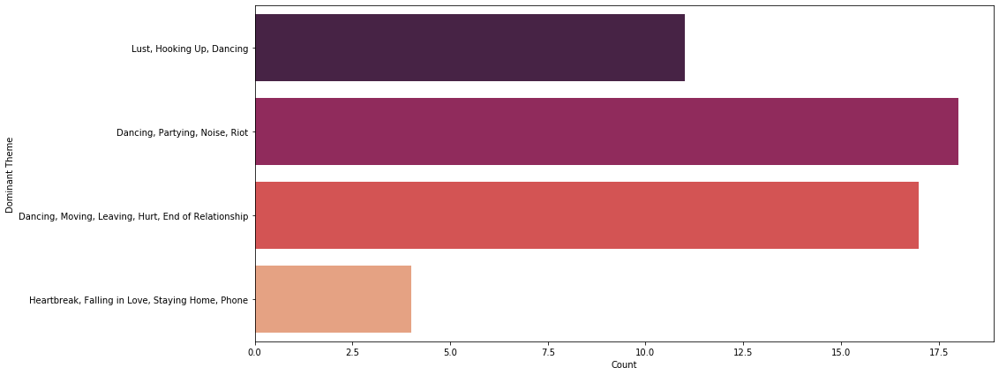

In [198]:
plt.figure(figsize=(15, 7))
sns.countplot(y='dominant_theme', data=globalx, palette='rocket', orient='h')
plt.ylabel('Dominant Theme')
plt.xlabel('Count')

In [187]:
# Getting list of dominant topics and dominant themes for USA chart 
usa_topics = df_new_topics[['dominant_topic', 'dominant_theme']][50:100]
usa['dominant_topic'] = list(usa_topics['dominant_topic'])
usa['dominant_theme'] = list(usa_topics['dominant_theme'])

In [188]:
# Getting list of dominant topics and dominant themes for UK chart 
uk_topics = df_new_topics[['dominant_topic', 'dominant_theme']][100:150]
uk['dominant_topic'] = list(uk_topics['dominant_topic'])
uk['dominant_theme'] = list(uk_topics['dominant_theme'])

In [189]:
# Getting list of dominant topics and dominant themes for Brazil chart 
brazil_topics = df_new_topics[['dominant_topic', 'dominant_theme']][150:200]
brazil['dominant_topic'] = list(brazil_topics['dominant_topic'])
brazil['dominant_theme'] = list(brazil_topics['dominant_theme'])

In [190]:
# Getting list of dominant topics and dominant themes for Germany chart 
germany_topics = df_new_topics[['dominant_topic', 'dominant_theme']][200:250]
germany['dominant_topic'] = list(germany_topics['dominant_topic'])
germany['dominant_theme'] = list(germany_topics['dominant_theme'])

In [191]:
# Getting list of dominant topics and dominant themes for Spain chart 
spain_topics = df_new_topics[['dominant_topic', 'dominant_theme']][250:300]
spain['dominant_topic'] = list(spain_topics['dominant_topic'])
spain['dominant_theme'] = list(spain_topics['dominant_theme'])

In [193]:
# Getting list of dominant topics and dominant themes for Mexico chart 
mexico_topics = df_new_topics[['dominant_topic', 'dominant_theme']][300:350]
mexico['dominant_topic'] = list(mexico_topics['dominant_topic'])
mexico['dominant_theme'] = list(mexico_topics['dominant_theme'])

In [194]:
# Getting list of dominant topics and dominant themes for Italy chart 
italy_topics = df_new_topics[['dominant_topic', 'dominant_theme']][350:400]
italy['dominant_topic'] = list(italy_topics['dominant_topic'])
italy['dominant_theme'] = list(italy_topics['dominant_theme'])

In [195]:
# Getting list of dominant topics and dominant themes for the Philippines chart 
philippines_topics = df_new_topics[['dominant_topic', 'dominant_theme']][400:450]
philippines['dominant_topic'] = list(philippines_topics['dominant_topic'])
philippines['dominant_theme'] = list(philippines_topics['dominant_theme'])

In [196]:
# Getting list of dominant topics and dominant themes for the Netherlands chart 
netherlands_topics = df_new_topics[['dominant_topic', 'dominant_theme']][450:500]
netherlands['dominant_topic'] = list(netherlands_topics['dominant_topic'])
netherlands['dominant_theme'] = list(netherlands_topics['dominant_theme'])

In [199]:
# Counting the number of songs in each topic for each country 
country_datasets = [globalx, usa, uk, brazil, germany, spain, mexico, italy, philippines, netherlands]

def get_topic_num(): 
    num_1 = []
    num_2 = []
    num_3 = []
    num_4 = []
    for country in country_datasets: 
        cat_1 = country.loc[country.dominant_topic == 1]
        num_1.append(len(cat_1))
        cat_2 = country.loc[country.dominant_topic == 2]
        num_2.append(len(cat_2))
        cat_3 = country.loc[country.dominant_topic == 3]
        num_3.append(len(cat_3))
        cat_4 = country.loc[country.dominant_topic == 4]
        num_4.append(len(cat_4))
    return num_1, num_2, num_3, num_4

topic1, topic2, topic3, topic4 = get_topic_num()
countries = ['Global', 'USA', 'UK', 'Brazil', 'Germany', 'Spain', 'Mexico', 'Italy', 'Philippines', 'Netherlands']

In [200]:
# Plotting values for all topics for all countries
fig = go.Figure(data=[
    go.Bar(name='Topic 1', x=countries, y=topic1),
    go.Bar(name='Topic 2', x=countries, y=topic2),
    go.Bar(name='Topic 3', x=countries, y=topic3),
    go.Bar(name='Topic 4', x=countries, y=topic4)
])
fig.update_layout(barmode='group')
fig.show()

## Word Embeddings

Here I wanted to understand more about the contextual relationships between the words in the corpus, so I used a Word2Vec model to vectorise all the word in their context and calculate the distance. Here, like with the topic modelling, I experimented with different parameters to find the best visual results.

In [201]:
# Creating lists of tokens for preprocessed lyrics and preprocessed nouns and verbs 
token_list = [word_tokenize(text) for text in all_lyrics.preprocessed]
token_list_nouns = [word_tokenize(text) for text in nouns_df.preprocessed]

In [202]:
# Defining function to reduce the word embeddings' dimensionality with TSNE and plot the results in 2D 
def tsne_plot(model):
    "Creates and TSNE model and plots it"
    labels = []
    tokens = []

    for word in model.wv.vocab:
        tokens.append(model[word])
        labels.append(word)
    
    tsne_model = TSNE(perplexity=40, n_components=2, init='pca', n_iter=2500, random_state=23)
    new_values = tsne_model.fit_transform(tokens)

    x = []
    y = []
    for value in new_values:
        x.append(value[0])
        y.append(value[1])
        
    plt.figure(figsize=(18, 18)) 
    for i in range(len(x)):
        plt.scatter(x[i],y[i])
        plt.annotate(labels[i],
                     xy=(x[i], y[i]),
                     xytext=(5, 2),
                     textcoords='offset points',
                     ha='right',
                     va='bottom')
    plt.show()

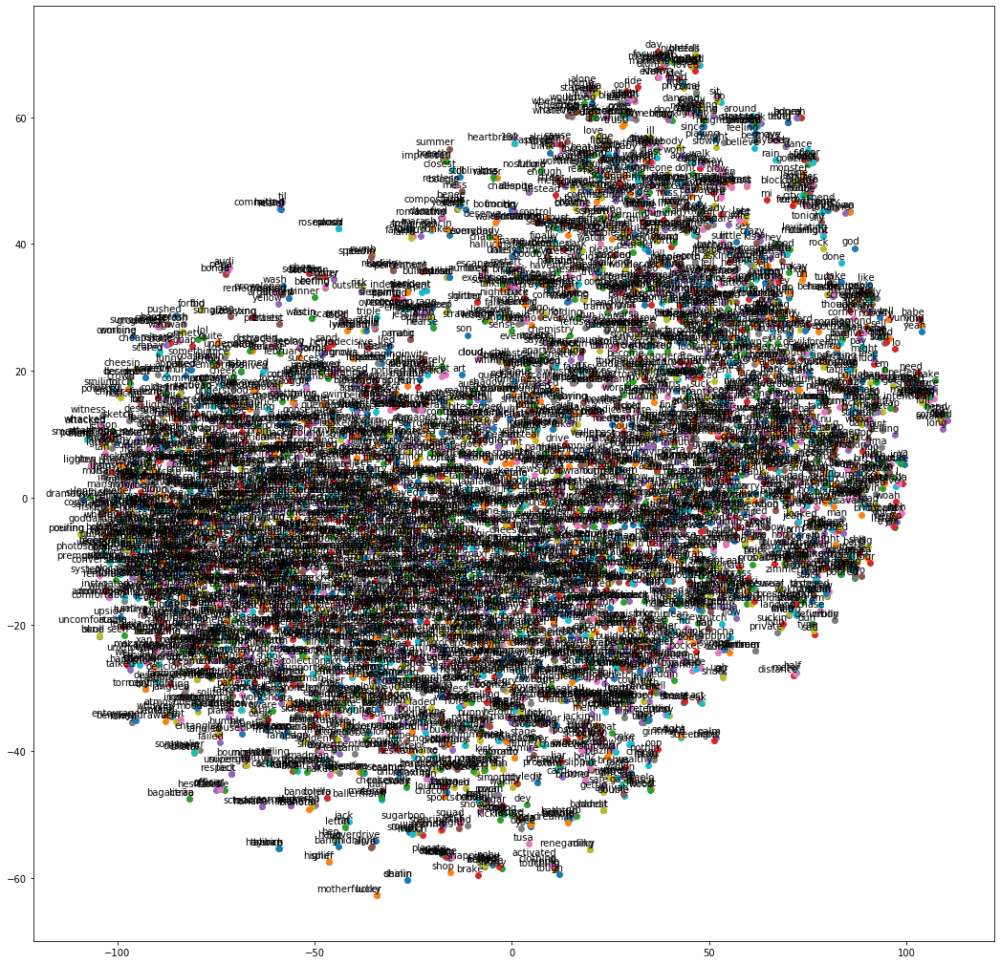

In [203]:
# First Word2Vec model with all preprocessed text 
w2v_model = gensim.models.Word2Vec(token_list,
                                   size=150,
                                   window=10,
                                   min_count=2,
                                   workers=10,
                                   iter=10)
tsne_plot(w2v_model)

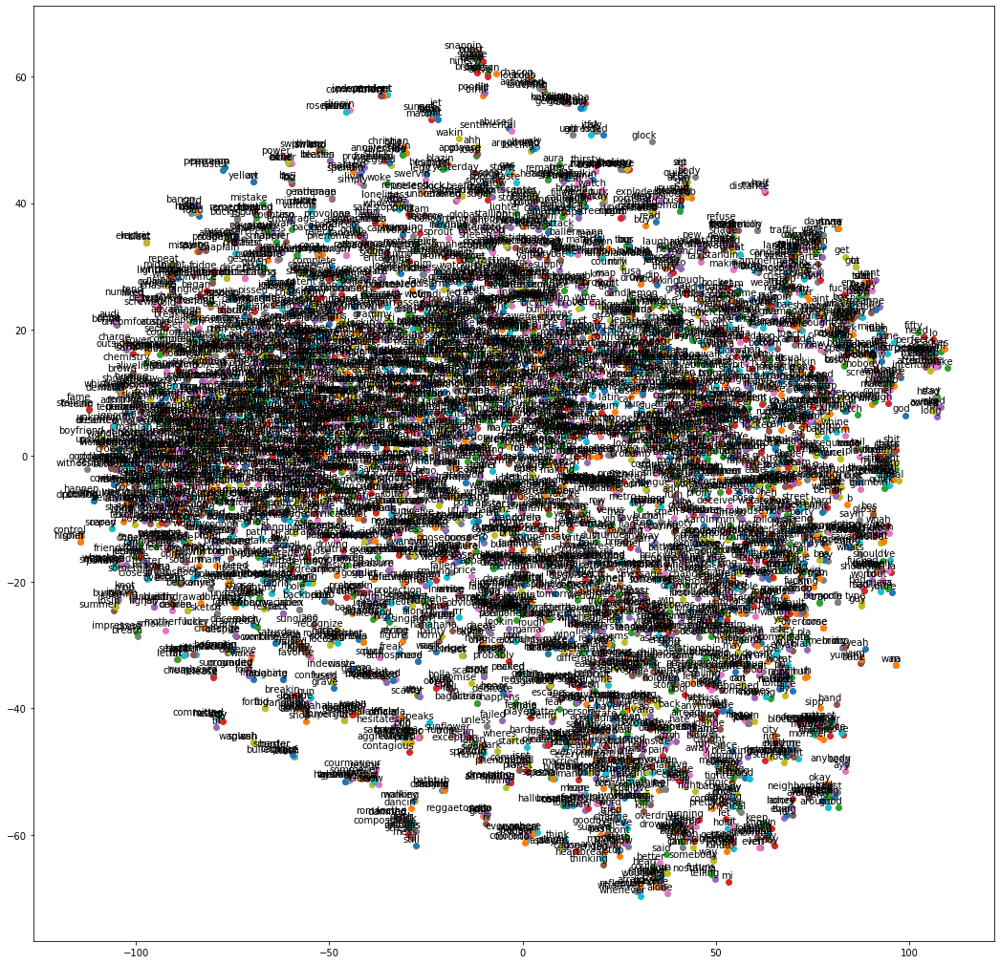

In [204]:
# Second Word2 Vec model with all preprocessed text but reduced size 
w2v_model3 = gensim.models.Word2Vec(token_list,  
                                    size=100,
                                    window=20,
                                    min_count=2,
                                    workers=4,
                                    iter=10)
tsne_plot(w2v_model3)

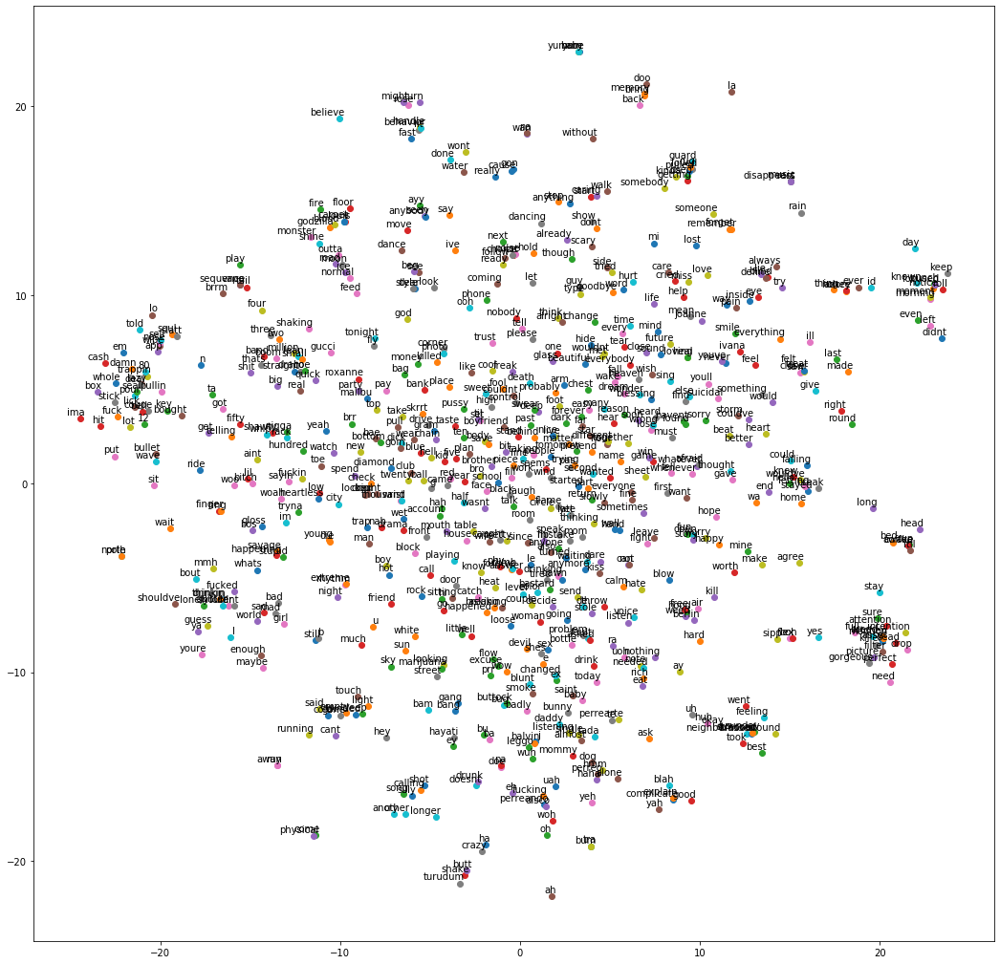

In [205]:
# Third Word2Vec model with all preprocessed text but even further reduced size 
w2v_model4 = gensim.models.Word2Vec(token_list, 
                                    size=80,
                                    window=20,
                                    min_count=25,
                                    workers=6,
                                    iter=10)
tsne_plot(w2v_model4)

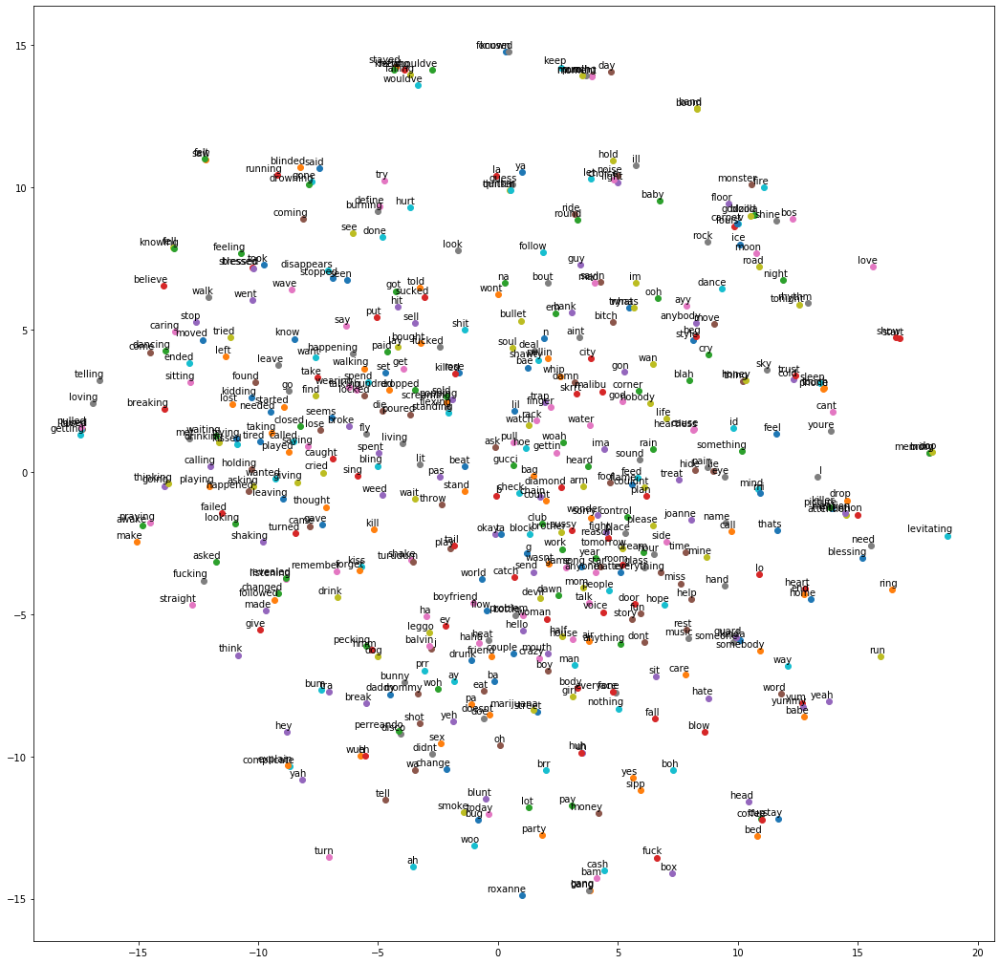

In [206]:
# Fourth Word2Vec model with only preprocessed words and nouns and the same size as the third model 
w2v_model5 = gensim.models.Word2Vec(token_list_nouns, 
                                    size=80,
                                    window=20,
                                    min_count=30,
                                    workers=6,
                                    iter=10)
tsne_plot(w2v_model5)

After creating the Word2Vec model and choosing the best parameters, I went back to the unigrams bar graphs earlier in this notebook and decided to look at the the most closely-related words to the top n-grams. I only looked at the unigrams which to me seemed semantically interesting and then plotted the values for the words/associated words which seemed most intriguing to me. 

In [211]:
# Most similar words to 'love'
word1 = ['love']
love = w2v_model5.wv.most_similar(positive=word1, topn=5)
love = dict(love)
love

{'fell': 0.6174724102020264,
 'knowing': 0.5138274431228638,
 'miss': 0.503859281539917,
 'hope': 0.4477185904979706,
 'leave': 0.44666627049446106}

In [212]:
# Most similar words to 'want'
word2 = ['want']
w2v_model5.wv.most_similar(positive=word2, topn=5)

[('take', 0.5821913480758667),
 ('spend', 0.5584207773208618),
 ('knowing', 0.5174702405929565),
 ('go', 0.5031008720397949),
 ('get', 0.4771188497543335)]

In [214]:
# Most similar words to 'baby'
word3 = ['baby']
baby = w2v_model5.wv.most_similar(positive=word3, topn=5)
baby = dict(baby)
baby

{'night': 0.6880385875701904,
 'trust': 0.6284574270248413,
 'choice': 0.6053742170333862,
 'light': 0.5917197465896606,
 'noise': 0.5673938989639282}

In [215]:
# Most similar words to 'time'
word4 = ['time']
time = w2v_model5.wv.most_similar(positive=word4, topn=5)
time = dict(time)
time

{'hour': 0.7477815747261047,
 'dream': 0.637570321559906,
 'mine': 0.635993242263794,
 'side': 0.6127109527587891,
 'beg': 0.5977833271026611}

In [216]:
# Most similar words to 'know'
word5 = ['know']
w2v_model5.wv.most_similar(positive=word5, topn=5)

[('try', 0.654106855392456),
 ('leave', 0.6009671688079834),
 ('done', 0.5487391948699951),
 ('say', 0.5317025780677795),
 ('started', 0.5146627426147461)]

In [217]:
# Most similar words to 'feel'
word6 = ['feel']
w2v_model5.wv.most_similar(positive=word6, topn=5)

[('sleep', 0.5439751148223877),
 ('pain', 0.5140780210494995),
 ('youre', 0.5131887197494507),
 ('find', 0.47549042105674744),
 ('joanne', 0.46565568447113037)]

In [218]:
# Most similar words to 'night'
word7 = ['night']                                          ### Use this one
night = w2v_model5.wv.most_similar(positive=word7, topn=5)
night = dict(night)
night

{'moon': 0.714629054069519,
 'road': 0.7030302286148071,
 'tonight': 0.6917171478271484,
 'baby': 0.6880385875701904,
 'sky': 0.6607536673545837}

In [219]:
# Most similar words to 'dance'
word8 = ['dance']                                          ### Use this one
dance = w2v_model5.wv.most_similar(positive=word8, topn=5)
dance = dict(dance)
dance

{'anybody': 0.7872314453125,
 'style': 0.7842155694961548,
 'beg': 0.7117520570755005,
 'blood': 0.6784863471984863,
 'godzilla': 0.6763375401496887}

In [220]:
# Most similar words to 'said'
word9 = ['said']                                           ### Use this one
said = w2v_model5.wv.most_similar(positive=word9, topn=5)
said = dict(said)
said

{'gone': 0.7945674061775208,
 'drowning': 0.7130784392356873,
 'blinded': 0.7063729763031006,
 'cried': 0.6490175724029541,
 'running': 0.5820440053939819}

In [232]:
# Most similar words to 'look'
word10 = ['look']
look = w2v_model5.wv.most_similar(positive=word10, topn=5)
look = dict(look)
look

{'turn': 0.5795979499816895,
 'see': 0.53370201587677,
 'burning': 0.5247534513473511,
 'define': 0.4877241253852844,
 'matter': 0.4692246913909912}

In [222]:
# Most similar words to 'heart'
word11 = ['heart']
heart = w2v_model5.wv.most_similar(positive=word11, topn=5)
heart = dict(heart)
heart

{'home': 0.7438079714775085,
 'end': 0.7109554409980774,
 'cause': 0.6611940264701843,
 'shouldve': 0.6553127765655518,
 'attention': 0.6337714195251465}

In [223]:
# Most similar words to 'bitch'
word12 = ['bitch']
w2v_model5.wv.most_similar(positive=word12, topn=5)

[('whip', 0.7681370973587036),
 ('whats', 0.7303988933563232),
 ('trap', 0.7057252526283264),
 ('lil', 0.700079083442688),
 ('tryna', 0.6908714175224304)]

Text(0.5, 0, 'Similarity')

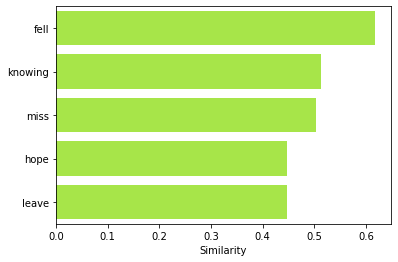

In [224]:
# Similarity plot for 'love'
sns.barplot(x=list(love.values()), y=list(love.keys()), color='greenyellow')
plt.xlabel('Similarity')

Text(0.5, 0, 'Similarity')

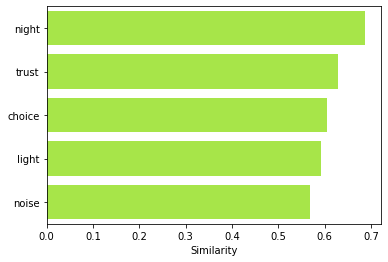

In [225]:
# Similarity plot for 'baby'
sns.barplot(x=list(baby.values()), y=list(baby.keys()), color='greenyellow')
plt.xlabel('Similarity')

Text(0.5, 0, 'Similarity')

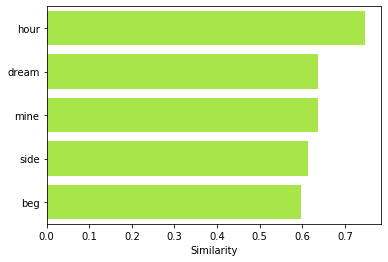

In [226]:
# Similarity plot for 'time'
sns.barplot(x=list(time.values()), y=list(time.keys()), color='greenyellow')
plt.xlabel('Similarity')

Text(0.5, 0, 'Similarity')

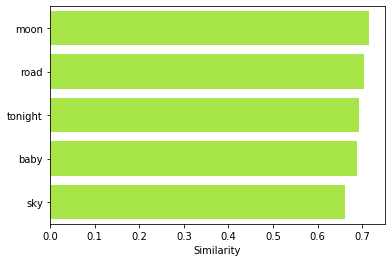

In [227]:
# Similarity plot for 'night'
sns.barplot(x=list(night.values()), y=list(night.keys()), color='greenyellow')
plt.xlabel('Similarity')

Text(0.5, 0, 'Similarity')

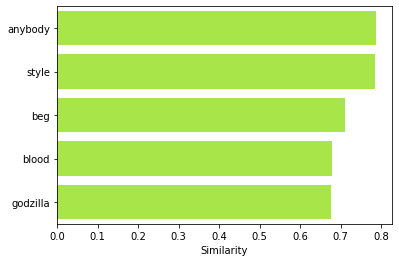

In [228]:
# Similarity plot for 'dance'
sns.barplot(x=list(dance.values()), y=list(dance.keys()), color='greenyellow')
plt.xlabel('Similarity')

Text(0.5, 0, 'Similarity')

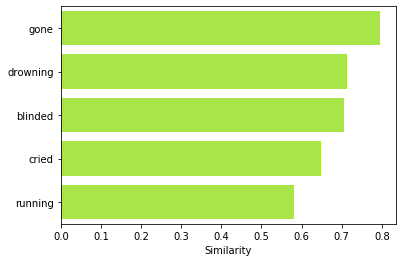

In [229]:
# Similarity plot for 'said'
sns.barplot(x=list(said.values()), y=list(said.keys()), color='greenyellow')
plt.xlabel('Similarity')

Text(0.5, 0, 'Similarity')

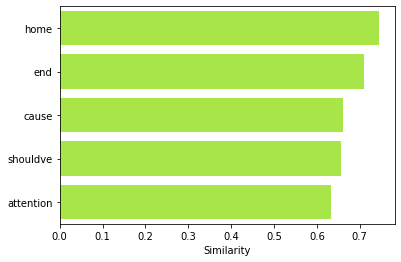

In [230]:
# Similarity plot for 'heart'
sns.barplot(x=list(heart.values()), y=list(heart.keys()), color='greenyellow')
plt.xlabel('Similarity')

Text(0.5, 0, 'Similarity')

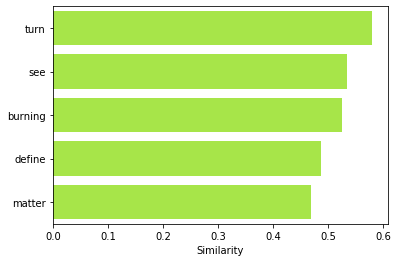

In [233]:
# Similarity plot for 'look'
sns.barplot(x=list(look.values()), y=list(look.keys()), color='greenyellow')
plt.xlabel('Similarity')